# 18: Indirect Space Charge

## Plot charge density grid

In [1]:
# import imageio
# import pickle
# import pandas as pd
import numpy as np
# import PyNAFF as pnf
import scipy.io as sio 
import matplotlib.cm as cm
from math import log10, floor
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.optimize import curve_fit
from mpl_toolkits.mplot3d import axes3d
from scipy.interpolate import RegularGridInterpolator

In [2]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 'small'
plt.rcParams['lines.linewidth'] = 1.5

### Function Declarations

In [19]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

def find_nearest_idx(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx-1
        
def eccentricity(semi_major, semi_minor):
    return np.sqrt(1-(semi_minor**2/semi_major**2))

# Input a and b, return n points on ellipse in (r, theta), (x,y) co-ordinates
def ellipse_theta(semi_major, semi_minor, npoints=3600):
    theta = []
    r = []
    x = []
    y = []
    
    # npoints between 0 and 2*pi
    angles = np.linspace(0., 2.*np.pi, npoints)   
        
    ecc = eccentricity(semi_major, semi_minor)  
    if ecc >= 1.:
        print 'Error: Shape is paraolic or hyperbolic, not elliptical'
        exit(0)
    else:
        print 'Ellipse eccentricity = ', ecc
        
        r_0 = (semi_major * (1.-ecc**2) ) / ( 1. + ecc*np.cos(0.) )
        x_0 = r_0 # (r_0*np.cos(0.)) as cos(0)=1
        c = semi_major-x_0
        
    for i in angles:
        r_ = (semi_major * (1.-ecc**2) ) / ( 1. + ecc*np.cos(i) ) 
        
        # Above expression r_ is an ellipse distributed around the focus
        # We need to shift to centre on zero     
        x_ = (r_*np.cos(i)) + c
        y_ = r_*np.sin(i)
        x.append(x_)
        y.append(y_)
        r.append(np.sqrt(x_**2 + y_**2))
        theta.append(np.arctan2(y_, x_)) 

    return r, theta, x, y

# Test class to handle Phi Grid
class PhiGrid:
    def __init__(self, filename, label, verbose =True):
        self.filename = filename
        self.label = label
        self.verbose = verbose
        self.initialise_data()        

    def initialise_data(self):
        # Load data
        p = dict()
        self.dd = dict()
        sio.loadmat(self.filename, mdict=p)
        self.dd[self.label] = p
        
        if self.verbose: print 'PhiGrid::initialise_data: Added output data from ', self.filename, '\t dictionary label: ', self.label        
        
        # Find 3D grid sizes
        self.x_grid_size = len(self.dd[self.label]['phi_grid'])
        if self.verbose: print 'PhiGrid::initialise_data: X grid length = ', (self.x_grid_size)
        self.y_grid_size = len(self.dd[self.label]['phi_grid'][self.x_grid_size-1])
        if self.verbose: print 'PhiGrid::initialise_data: Y grid length = ', (self.y_grid_size)
        self.z_grid_size = len(self.dd[self.label]['phi_grid'][self.x_grid_size-1][self.y_grid_size-1])
        if self.verbose: print 'PhiGrid::initialise_data: Z grid length = ', (self.z_grid_size)
        
        # Create x, y, z index arrays
        self.x_ = np.linspace(1,self.x_grid_size,self.x_grid_size, dtype='int')
        self.y_ = np.linspace(1,self.y_grid_size,self.y_grid_size, dtype='int')
        self.z_ = np.linspace(1,self.z_grid_size,self.z_grid_size, dtype='int')
        
        # Populate co-ordinate arrays
        x_co = []
        y_co = []
        z_co = []
        for ix in xrange(self.x_grid_size):
            x_co.append(self.dd[self.label]['x_grid'][ix][0][0])
        for iy in xrange(self.y_grid_size):
            y_co.append(self.dd[self.label]['y_grid'][0][iy][0])
        for iz in xrange(self.z_grid_size):
            z_co.append(self.dd[self.label]['z_grid'][0][0][iz])
        
        self.x = np.array(x_co)
        self.y = np.array(y_co)
        self.z = np.array(z_co)        
        
    def get_x_indices(self):
        return self.x_
                
    def get_y_indices(self):
        return self.y_
                
    def get_z_indices(self):
        return self.z_
    
    def get_central_z_index(self):
        return (self.get_z_grid_length()/2)-1
        
    def get_indices(self):
        return self.x_,self.y_,self.z_
    
    def get_x_coordinates(self):
        return self.x
                
    def get_y_coordinates(self):
        return self.y
                
    def get_z_coordinates(self):
        return self.z
    
    def get_coordinates(self):
        return self.x,self.y,self.z
    
    def get_x_grid_length(self):
        return self.x_grid_size
                
    def get_y_grid_length(self):
        return self.y_grid_size
                
    def get_z_grid_length(self):
        return self.z_grid_size
    
    def get_grid_lengths(self):
        return self.x_grid_size,self.y_grid_size,self.z_grid_size
    
    # return a single value of phi for index x_,y_,z_
    def get_phi_xyz(self,x_,y_,z_):
        return self.dd[self.label]['phi_grid'][x_][y_][z_]
    
    # return a single value of phi for a co-ordinate x,y,z (in metres)
    def get_interpolated_phi_xyz_co_ordinate(self,x,y,z):
              
        # Check if we need to interpolate
        tolerance = 1E-4 #(0.1mm)
        tolerance_z = 50E-3 #(50mm)
        nearest_x = find_nearest(self.x, x)
        nearest_y = find_nearest(self.y, y)
        nearest_z = find_nearest(self.z, z)      
                    
        # First we need to find the indices relating to the x,y,z
        idx_1 = find_nearest_idx(self.x, x)+1
        idy_1 = find_nearest_idx(self.y, y)+1
        idz_1 = find_nearest_idx(self.z, z)+1   
        
        # Check if we need to interpolate         
        if (np.abs(x-nearest_x) <= tolerance) and (np.abs(y-nearest_y) <= tolerance) and (np.abs(z-nearest_z) <= tolerance_z):
            print 'PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point'
            print 'Requested co-ordinates = ', x ,y, z
            print 'Nearest neighbours = ', nearest_x, nearest_y, nearest_z
            return self.get_phi_xyz(idx_1, idy_1, idz_1)
        
        # We create a cube around the requested co-ordinate in order to interpolate 
        # the final value of phi
        # Each vertex is defined by an existing point on our space charge grid
        # We need 6 indices in total for the 6 vertices of the cube
        
        # Check if value is on left or right of indexed value
        if x - self.x[idx_1] <= 0. : #left   
            idx_2 = idx_1   
            idx_1 = idx_2 - 1       
        else: #right
            idx_2 = idx_1 + 1              
        if y - self.y[idy_1] <= 0. : #left
            idy_2 = idy_1  
            idy_1 = idy_2 - 1   
        else: #right                      
            idy_2 = idy_1 + 1  
        if z - self.z[idz_1] <= 0. : #left
            idz_2 = idz_1  
            idz_1 = idz_2 - 1   
        else:  #right                        
            idz_2 = idz_1 + 1   

        #print 'x = ', x, '\nself.x[idx_1] = ', self.x[idx_1], '\nself.x[idx_2] = ', self.x[idx_2]
        #print 'y = ', y, '\nself.y[idy_1] = ', self.y[idy_1], '\nself.y[idy_2] = ', self.y[idy_2]
        #print 'z = ', z, '\nself.z[idz_1] = ', self.z[idz_1], '\nself.z[idz_2] = ', self.z[idz_2]
            
        # Check that our indices are not beyond a boundary limit
        if idx_2 >= self.get_x_grid_length():
            print 'PhiGrid::get_interpolated_phi_xyz_co_ordinate: x index exceeds data, shifting down'
            idx_2 = idx_1
            idx_1 = idx_1 - 1
            
        if idy_2 >= self.get_y_grid_length():
            print 'PhiGrid::get_interpolated_phi_xyz_co_ordinate: y index exceeds data, shifting down'
            idy_2 = idy_1
            idy_1 = idy_1 - 1
            
        if idz_2 >= self.get_z_grid_length():
            print 'PhiGrid::get_interpolated_phi_xyz_co_ordinate: z index exceeds data, shifting down'
            idz_2 = idz_1
            idz_1 = idz_1 - 1            
        
        x_id_ar = np.array([idx_1, idx_2])
        y_id_ar = np.array([idy_1, idy_2])
        z_id_ar = np.array([idz_1, idz_2])        
        
        x_ar = np.array([self.x[idx_1], self.x[idx_2]])
        y_ar = np.array([self.y[idy_1], self.y[idy_2]])
        z_ar = np.array([self.z[idz_1], self.z[idz_2]])        
                
        # Need to fill data array with the correct phi values
        
        # first xy grid at z=0
        phi_000 = self.get_phi_xyz(x_id_ar[0], y_id_ar[0], z_id_ar[0])
        phi_100 = self.get_phi_xyz(x_id_ar[1], y_id_ar[0], z_id_ar[0])
        phi_010 = self.get_phi_xyz(x_id_ar[0], y_id_ar[1], z_id_ar[0])
        phi_110 = self.get_phi_xyz(x_id_ar[1], y_id_ar[1], z_id_ar[0])
        
        # second xy grid at z=1
        phi_001 = self.get_phi_xyz(x_id_ar[0], y_id_ar[0], z_id_ar[1]) 
        phi_101 = self.get_phi_xyz(x_id_ar[1], y_id_ar[0], z_id_ar[1]) 
        phi_011 = self.get_phi_xyz(x_id_ar[0], y_id_ar[1], z_id_ar[1])
        phi_111 = self.get_phi_xyz(x_id_ar[1], y_id_ar[1], z_id_ar[1])       
        
        data = np.array([ [ [phi_000,phi_100],[phi_010,phi_110] ] , [ [phi_001,phi_101],[phi_011,phi_111] ] ])
        
        # Use scipy.interpolate RegularGridInterpolator to perform the interpolation
        simple_phi_interpolator = RegularGridInterpolator((x_ar, y_ar, z_ar), data)          
        pts = np.array([x,y,z])    
        
        return simple_phi_interpolator(pts)
            
    # return a single xy grid for a given z (in arbitrary unit not metres)
    def get_phi_xy_grid(self,z):
        m = np.zeros(shape=[self.y_grid_size, self.x_grid_size])        
        for iy in self.y_:
            for ix in self.x_:
                m[iy-1,ix-1] = self.dd[self.label]['phi_grid'][ix-1][iy-1][z]        
        return m   
    
    # return a single xz grid for a given y (in arbitrary unit not metres)
    def get_phi_xz_grid(self,y):
        m = np.zeros(shape=[self.z_grid_size, self.x_grid_size])        
        for iz in self.z_:
            for ix in self.x_:
                m[iz-1,ix-1] = self.dd[self.label]['phi_grid'][ix-1][y][iz-1]        
        return m  
    
    # return a single xy grid for a given z (in arbitrary unit not metres)
    def get_Ex_xy_grid(self,z):
        m = np.zeros(shape=[self.y_grid_size, self.x_grid_size])        
        for iy in self.y_:
            for ix in self.x_:
                m[iy-1,ix-1] = self.dd[self.label]['Ex_grid'][ix-1][iy-1][z]        
        return m     
    
    # return a single x slice for a given y,z index
    def get_phi_x_slice(self,y,z):
        m = np.zeros(shape=[self.x_grid_size])        
        for ix in self.x_:
            m[ix-1] = self.dd[self.label]['phi_grid'][ix-1][y][z]        
        return m  
    
    def get_xy_wireframes(self):        
        # Our x array is co-ordinates only, repeated for y rows
        x_wireframe = np.zeros(shape=[self.get_y_grid_length(), self.get_x_grid_length()])
        for iy in xrange(self.get_y_grid_length()):
            x_wireframe[iy] = self.get_x_coordinates()

        # Our y array is co-ordinates only, repeated for x rows
        y_wireframe = np.zeros(shape=[self.get_x_grid_length(), self.get_y_grid_length()])
        for ix in xrange(self.get_x_grid_length()):
            y_wireframe[ix] = self.get_y_coordinates()
            
        # Don't forget to transpose the Y so that both have the same shape for plotting
        return x_wireframe, y_wireframe.T
    
    def get_xz_wireframes(self):        
        # Our x array is co-ordinates only, repeated for y rows
        x_wireframe = np.zeros(shape=[self.get_z_grid_length(), self.get_x_grid_length()])
        for iz in xrange(self.get_z_grid_length()):
            x_wireframe[iz] = self.get_x_coordinates()

        # Our y array is co-ordinates only, repeated for x rows
        z_wireframe = np.zeros(shape=[self.get_x_grid_length(), self.get_z_grid_length()])
        for ix in xrange(self.get_x_grid_length()):
            z_wireframe[ix] = self.get_z_coordinates()
            
        # Don't forget to transpose the Y so that both have the same shape for plotting
        return x_wireframe, z_wireframe.T

    
    def plot_xy_phi_wireframe(self, z, title='Phi_Grid', label='', save=False, savename='Phi_Grid.png'):
    #def plot_xy_phi_wireframe(self, z, title, label, save, savename):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111, projection='3d')

        tit = str(title + ' ' + label + ' z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel('y [m]');
        ax1.set_zlabel(r'$\phi_{SC}$ [-]');

        z_len = int(self.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # Choice of z is important - here we take the central grid point
        phi_wireframe = self.get_phi_xy_grid(z)
        surf = ax1.plot_wireframe(self.get_xy_wireframes()[0], self.get_xy_wireframes()[1], phi_wireframe, rstride=1, cstride=1, linewidth=0.5, antialiased=True, alpha=.7)

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
    
    def plot_elliptical_boundary(self, z, semi_major, semi_minor, npoints=3600, title='Phi_Elliptical_Boundary', label='', save=False, savename='Phi_Elliptical_boundary.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111)

        tit = str(title + ' ' + label + ', z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel(r'$\theta$ [rad]');
        ax1.set_ylabel(r'$\phi_{SC}$ [-]');

        z_len = int(self.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # List of theta
        thetas = np.linspace(0., 2*np.pi, npoints)
        
        # For each point in theta we need an x,y co-ordinate that corresponds to the boundary position
        # Make an elliptical boundary
        ellipse_r, ellipse_thet, ellipse_x, ellipse_y = ellipse_theta(0.73, 0.35, npoints)
        
        # Then we need to plot the value of phi at that x,y co-ordinate
        phis = []        
        
        for i in xrange(len(thetas)):
            # First check that calculated values are within our data limits
            if ellipse_x[i] < np.min(self.x) or ellipse_x[i] > np.max(self.x):
                print 'PhiGrid::plot_elliptical_boundary: Error: calculated boundary x value of ', ellipse_x[i], ' outside data limits'
                print '\nnp.min(self.x) = ', np.min(self.x), '\nnp.max(self.x) = ', np.max(self.x)
                exit(0)
            if ellipse_y[i] < np.min(self.y) or ellipse_y[i] > np.max(self.y):
                print 'PhiGrid::plot_elliptical_boundary: Error: calculated boundary y value of ', ellipse_y[i], ' outside data limits'
                print '\nnp.min(self.y) = ', np.min(self.y), '\nnp.max(self.y) = ', np.max(self.y)
                exit(0)
            
            # Get interpolated value           
            phis.append(self.get_interpolated_phi_xyz_co_ordinate(ellipse_x[i], ellipse_y[i], self.z[z]))
            
        #ax1.plot(ellipse_x, ellipse_y) #PLot ellipse to check
        ax1.plot(thetas, phis)

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
        
    
    def plot_elliptical_boundary_check(self, z, semi_major, semi_minor, npoints=3600, title='Phi_Elliptical_Boundary_Check', label='', save=False, savename='Phi_Elliptical_boundary_check.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111)

        tit = str(title + ' ' + label + ', z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel('y [m]');

        z_len = int(self.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # List of theta
        thetas = np.linspace(0., 2*np.pi, npoints)
        
        # For each point in theta we need an x,y co-ordinate that corresponds to the boundary position      
        # Make an elliptical boundary
        ellipse_r, ellipse_thet, ellipse_x, ellipse_y = ellipse_theta(0.73, 0.35, npoints)        
                
        # Then we need to plot the value of phi at that x,y co-ordinate
        phis = [] 
        
        for i in xrange(len(thetas)):
            # First check that calculated values are within our data limits
            if ellipse_x[i] < np.min(self.x) or ellipse_x[i] > np.max(self.x):
                print 'PhiGrid::plot_elliptical_boundary: Error: calculated boundary x value of ', ellipse_x[i], ' outside data limits'
                print '\nnp.min(self.x) = ', np.min(self.x), '\nnp.max(self.x) = ', np.max(self.x)
                exit(0)
            if ellipse_y[i] < np.min(self.y) or ellipse_y[i] > np.max(self.y):
                print 'PhiGrid::plot_elliptical_boundary: Error: calculated boundary y value of ', ellipse_y[i], ' outside data limits'
                print '\nnp.min(self.y) = ', np.min(self.y), '\nnp.max(self.y) = ', np.max(self.y)
                exit(0)
            
            # Get interpolated value           
            phis.append(self.get_interpolated_phi_xyz_co_ordinate(ellipse_x[i], ellipse_y[i], self.z[z]))
            
        ax1.plot(ellipse_x, ellipse_y, color='r') #Plot ellipse to check  
        
        mesh = np.meshgrid(self.x, self.y)
        gridx = []
        gridy = []
        for ix in self.x:
            for iy in self.y:
                gridx.append(ix)
                gridy.append(iy)
        
        ax1.scatter(gridx, gridy, marker='.', s=0.1, color='b')
        
        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
        
    def plot_elliptical_boundary_scatter(self, z, semi_major, semi_minor, npoints=3600, title='Space Charge Potential at Boundary\n', label='', save=False, savename='Phi_Elliptical_boundary_scatter.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111, projection='3d')
        
        tit = str(title + ' ' + label + ', z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel('y [m]');
        ax1.set_zlabel(r'$\phi_{SC}$ [-]');

        z_len = int(self.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # List of theta
        thetas = np.linspace(0., 2*np.pi, npoints)
        
        # For each point in theta we need an x,y co-ordinate that corresponds to the boundary position
        
        
        # Then we need to plot the value of phi at that x,y co-ordinate
        phis = [] 
        
        # Make an elliptical boundary
        ellipse_r, ellipse_thet, ellipse_x, ellipse_y = ellipse_theta(0.73, 0.35, npoints)
        
        for i in xrange(len(thetas)):
            # First check that calculated values are within our data limits
            if ellipse_x[i] < np.min(self.x) or ellipse_x[i] > np.max(self.x):
                print 'PhiGrid::plot_elliptical_boundary: Error: calculated boundary x value of ', ellipse_x[i], ' outside data limits'
                print '\nnp.min(self.x) = ', np.min(self.x), '\nnp.max(self.x) = ', np.max(self.x)
                exit(0)
            if ellipse_y[i] < np.min(self.y) or ellipse_y[i] > np.max(self.y):
                print 'PhiGrid::plot_elliptical_boundary: Error: calculated boundary y value of ', ellipse_y[i], ' outside data limits'
                print '\nnp.min(self.y) = ', np.min(self.y), '\nnp.max(self.y) = ', np.max(self.y)
                exit(0)
            
            # Get interpolated value           
            phis.append(self.get_interpolated_phi_xyz_co_ordinate(ellipse_x[i], ellipse_y[i], self.z[z]))
            
        #ax1.plot(ellipse_x, ellipse_y) #PLot ellipse to check
        #ax1.plot(thetas, phis)
        ax1.scatter(ellipse_x, ellipse_y, phis, marker='.', s=2)
        
        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
    
    def plot_x_phi_slice(self, y, z, title='Phi_x_slice', label='', save=False, savename='Phi_x_Slice.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111)

        tit = str(title + ' ' + label + ', y = ' + str(round_sig(self.get_y_coordinates()[y])) + ' m, z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel(r'$\phi_{SC}$ [-]');

        z_len = int(self.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # Choice of z is important - here we take the central grid point
        ax1.plot(self.x, self.get_phi_x_slice(y,z))

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
        
    def plot_x_phi_all_y_slices(self, z, title='Phi_x_all_y_slices', label='', save=False, savename='Phi_x_All_y_Slices.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111)

        tit = str(title + ' ' + label + ', z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel(r'$\phi_{SC}$ [-]');

        y_len = int(self.get_y_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, y_len))
        c_it = int(0)
        
        # Choice of z is important - here we take the central grid point
        for iy in self.y_:
            ax1.plot(self.x, self.get_phi_x_slice(iy-1,z), color=colors[c_it])
            c_it = c_it + 1

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
    
    def plot_xy_phi_surface(self, z, title='Phi_Grid', label='', save=False, savename='Phi_Grid.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 1.0

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111, projection='3d')

        tit = str(title + ' ' + label + ', z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel('y [m]');
        ax1.set_zlabel(r'$\phi_{SC}$ [-]');

        z_len = int(self.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # Choice of z is important - here we take the central grid point
        phi_wireframe = self.get_phi_xy_grid(z)
        surf = ax1.plot_surface(self.get_xy_wireframes()[0], self.get_xy_wireframes()[1], phi_wireframe, cmap=cm.jet, rstride=1, cstride=1, linewidth=1., antialiased=True, alpha=.7)

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename, dpi = 800);
        plt.show()
    
    def plot_xz_phi_surface(self, y, title='Phi_Grid', label='', save=False, savename='Phi_Grid.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111, projection='3d')

        tit = str(title + ' ' + label + ', y = ' + str(round_sig(self.get_y_coordinates()[y])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel('z [m]');
        ax1.set_zlabel(r'$\phi_{SC}$ [-]');

        z_len = int(self.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # Choice of z is important - here we take the central grid point
        phi_wireframe = self.get_phi_xz_grid(y)
        surf = ax1.plot_surface(self.get_xz_wireframes()[0], self.get_xz_wireframes()[1], phi_wireframe, cmap=cm.jet, rstride=1, cstride=1, linewidth=1., antialiased=True, alpha=.7)

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()
    
    def plot_xy_Ex_surface(self, z, title='Phi_Grid', label='', save=False, savename='Phi_Grid.png'):
        
        plt.rcParams['figure.figsize'] = [5.0, 5.0]
        plt.rcParams['figure.dpi'] = 200
        plt.rcParams['savefig.dpi'] = 200

        plt.rcParams['font.size'] = 10
        plt.rcParams['legend.fontsize'] = 'small'
        plt.rcParams['lines.linewidth'] = 0.5

        fig1 = plt.figure(facecolor='w', edgecolor='k')
        ax1 = fig1.add_subplot(111, projection='3d')

        tit = str(title + ' ' + label + ', z = ' + str(round_sig(self.get_z_coordinates()[z])) + ' m')
        ax1.set_title(tit);

        ax1.set_xlabel('x [m]');
        ax1.set_ylabel('y [m]');
        ax1.set_zlabel(r'$E_{x}$ [-]');

        z_len = int(self.get_z_grid_length())

        colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
        c_it = int(0)

        # Choice of z is important - here we take the central grid point
        phi_wireframe = self.get_Ex_xy_grid(z)
        surf = ax1.plot_surface(self.get_xy_wireframes()[0], self.get_xy_wireframes()[1], phi_wireframe, cmap=cm.jet, rstride=1, cstride=1, linewidth=1., antialiased=True, alpha=.7)

        ax1.grid(lw=1, ls=':');
        plt.tight_layout()
        if save: plt.savefig(savename);
        plt.show()    

In [4]:
def round_sig(x, sig=3):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [5]:
def add_input_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print '\tAdded output data from ', filename, '\t dictionary key: ', label
	return dd

In [6]:
def add_rho_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print '\tAdded output data from ', filename, '\t dictionary key: ', label
	return dd

In [7]:
def round_sig(x, sig=3):
    return round(x, sig-int(floor(log10(abs(x))))-1)

## Labels etc

In [8]:
save_folder = 'Plots/'
sc = 'SbS'
legend_label = 'Case'
main_label = 'PS'
betagamma = 2.492104532 * 0.9159915293879255

# Doubled SC grid size

# Import data

In [9]:
nModes1 = PhiGrid('Grids/nModes1/space_charge_output/Phi_grid_0.mat', 'nModes=1')
nModes10 = PhiGrid('Grids/nModes10/space_charge_output/Phi_grid_0.mat', 'nModes=10')
nModes20 = PhiGrid('Grids/nModes20/space_charge_output/Phi_grid_0.mat', 'nModes=20')
nModes30 = PhiGrid('Grids/nModes30/space_charge_output/Phi_grid_0.mat', 'nModes=30')
nModes40 = PhiGrid('Grids/nModes40/space_charge_output/Phi_grid_0.mat', 'nModes=40')
nModes50 = PhiGrid('Grids/nModes50/space_charge_output/Phi_grid_0.mat', 'nModes=50')
nModes60 = PhiGrid('Grids/nModes60/space_charge_output/Phi_grid_0.mat', 'nModes=60')
nModes100 = PhiGrid('Grids/nModes100/space_charge_output/Phi_grid_0.mat', 'nModes=100')
semi_major = 0.73
semi_minor = 0.35

TypeError: 'NoneType' object is not iterable

In [ ]:
nModes1.plot_elliptical_boundary_scatter(nModes1.get_central_z_index(), semi_major, semi_minor, npoints=3600, title='Space Charge Potential at Boundary\n', label='nModes=1', save=True, savename='Phi_Elliptical_boundary_scatter_nModes1.png')

In [ ]:
nModes10.plot_elliptical_boundary_scatter(nModes10.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=10', save=True, savename='Phi_Elliptical_boundary_scatter_nModes10.png')

In [ ]:
nModes20.plot_elliptical_boundary_scatter(nModes20.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=20', save=True, savename='Phi_Elliptical_boundary_scatter_nModes20.png')

In [ ]:
nModes30.plot_elliptical_boundary_scatter(nModes30.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=30', save=True, savename='Phi_Elliptical_boundary_scatter_nModes30.png')

In [ ]:
nModes40.plot_elliptical_boundary_scatter(nModes40.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=40', save=True, savename='Phi_Elliptical_boundary_scatter_nModes40.png')

In [ ]:
nModes50.plot_elliptical_boundary_scatter(nModes50.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=50', save=True, savename='Phi_Elliptical_boundary_scatter_nModes50.png')

In [ ]:
nModes60.plot_elliptical_boundary_scatter(nModes60.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=60', save=True, savename='Phi_Elliptical_boundary_scatter_nModes60.png')

In [ ]:
nModes100.plot_elliptical_boundary_scatter(nModes100.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=100', save=True, savename='Phi_Elliptical_boundary_scatter_nModes100.png')

# Original SC grid size

In [20]:
nModes1 = PhiGrid('nModes1/space_charge_output/Phi_grid_0.mat', 'nModes=1')
nModes10 = PhiGrid('nModes10/space_charge_output/Phi_grid_0.mat', 'nModes=10')
nModes20 = PhiGrid('nModes20/space_charge_output/Phi_grid_0.mat', 'nModes=20')
nModes30 = PhiGrid('nModes30/space_charge_output/Phi_grid_0.mat', 'nModes=30')
nModes40 = PhiGrid('nModes40/space_charge_output/Phi_grid_0.mat', 'nModes=40')
nModes45 = PhiGrid('nModes45/space_charge_output/Phi_grid_0.mat', 'nModes=45')
nModes50 = PhiGrid('nModes50/space_charge_output/Phi_grid_0.mat', 'nModes=50')
nModes55 = PhiGrid('nModes55/space_charge_output/Phi_grid_0.mat', 'nModes=55')
nModes60 = PhiGrid('nModes60/space_charge_output/Phi_grid_0.mat', 'nModes=60')
nModes100 = PhiGrid('nModes100/space_charge_output/Phi_grid_0.mat', 'nModes=100')
nModes256 = PhiGrid('nModes256/space_charge_output/Phi_grid_0.mat', 'nModes=256')
semi_major = 0.73
semi_minor = 0.35

PhiGrid::initialise_data: Added output data from  nModes1/space_charge_output/Phi_grid_0.mat 	 dictionary label:  nModes=1
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64
PhiGrid::initialise_data: Added output data from  nModes10/space_charge_output/Phi_grid_0.mat 	 dictionary label:  nModes=10
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64
PhiGrid::initialise_data: Added output data from  nModes20/space_charge_output/Phi_grid_0.mat 	 dictionary label:  nModes=20
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64
PhiGrid::initialise_data: Added output data from  nModes30/space_charge_output/Phi_grid_0.mat 	 dictionary label:  nModes=30
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid le

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.7299912219642443 0.0017164018711800198 -0.17665813317212908
Nearest neighbours =  0.73 0.0017073170731707332 -0.17665813317212908
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.7299209626167665 0.00515022417515914 -0.17665813317212908
Nearest neighbours =  0.73 0.0051219512195122 -0.17665813317212908
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.7253715180311254 0.039350604473063246 -0.17665813317212908
Nearest neighbours =  0.7253054662379421 0.039268292682926864 -0.17665813317212908
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate wit

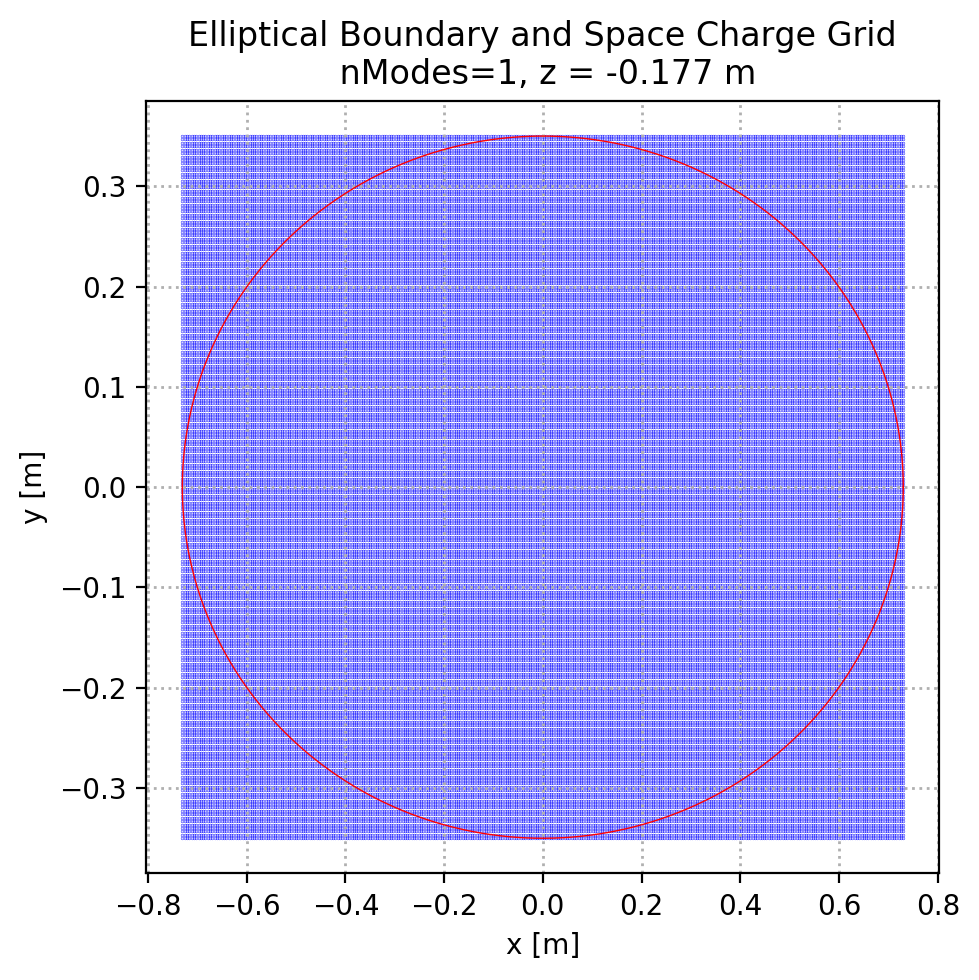

In [21]:
nModes1.plot_elliptical_boundary_check(nModes1.get_central_z_index(), semi_major, semi_minor, npoints=3600, title='Elliptical Boundary and Space Charge Grid\n', label='nModes=1', save=True, savename='Phi_Elliptical_boundary_check_nModes1.png')

# Plot boundary potential as 3D scatter

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.7299912219642443 0.0017164018711800198 -0.17665813317212908
Nearest neighbours =  0.73 0.0017073170731707332 -0.17665813317212908
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.7299209626167665 0.00515022417515914 -0.17665813317212908
Nearest neighbours =  0.73 0.0051219512195122 -0.17665813317212908
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.7253715180311254 0.039350604473063246 -0.17665813317212908
Nearest neighbours =  0.7253054662379421 0.039268292682926864 -0.17665813317212908
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate wit

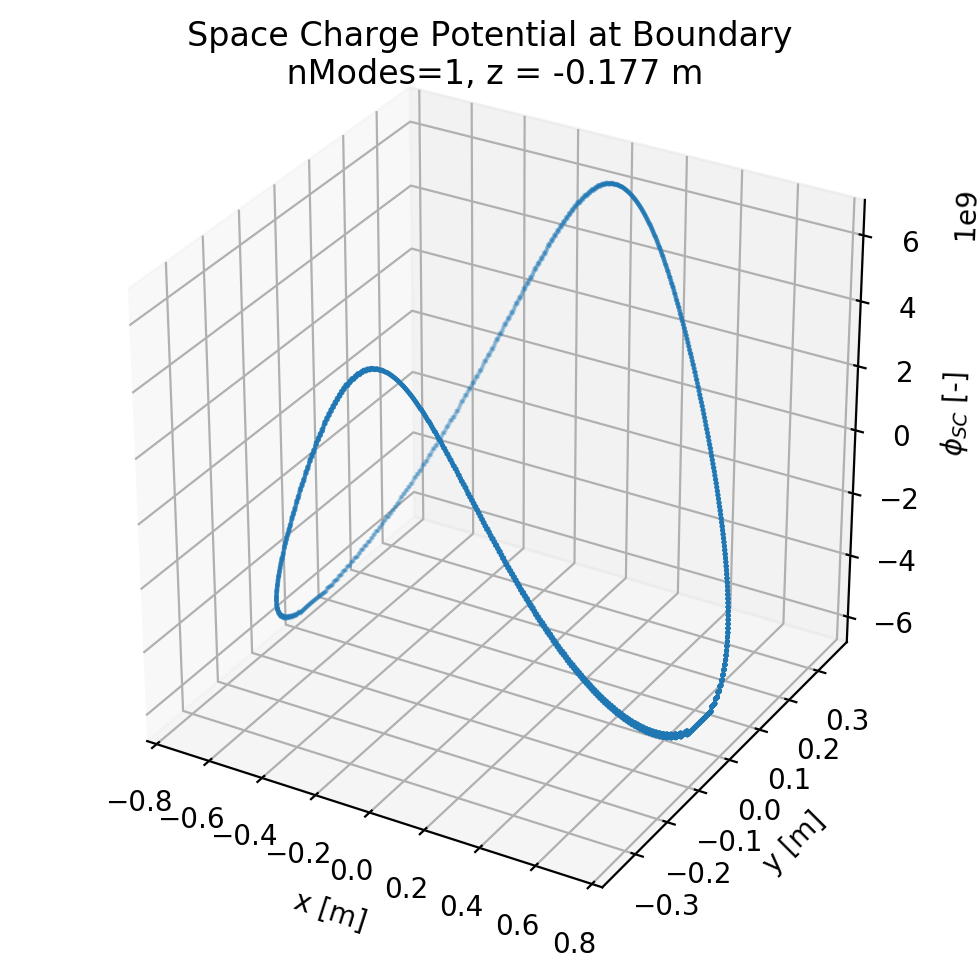

In [10]:
nModes1.plot_elliptical_boundary_scatter(nModes1.get_central_z_index(), semi_major, semi_minor, npoints=3600, title='Space Charge Potential at Boundary\n', label='nModes=1', save=True, savename='Phi_Elliptical_boundary_scatter_nModes1.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.16259871253948077
Nearest neighbours =  0.73 0.0017073170731707332 -0.16259871253948077
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.16259871253948077
Nearest neighbours =  0.73 -0.0017073170731707332 -0.16259871253948077


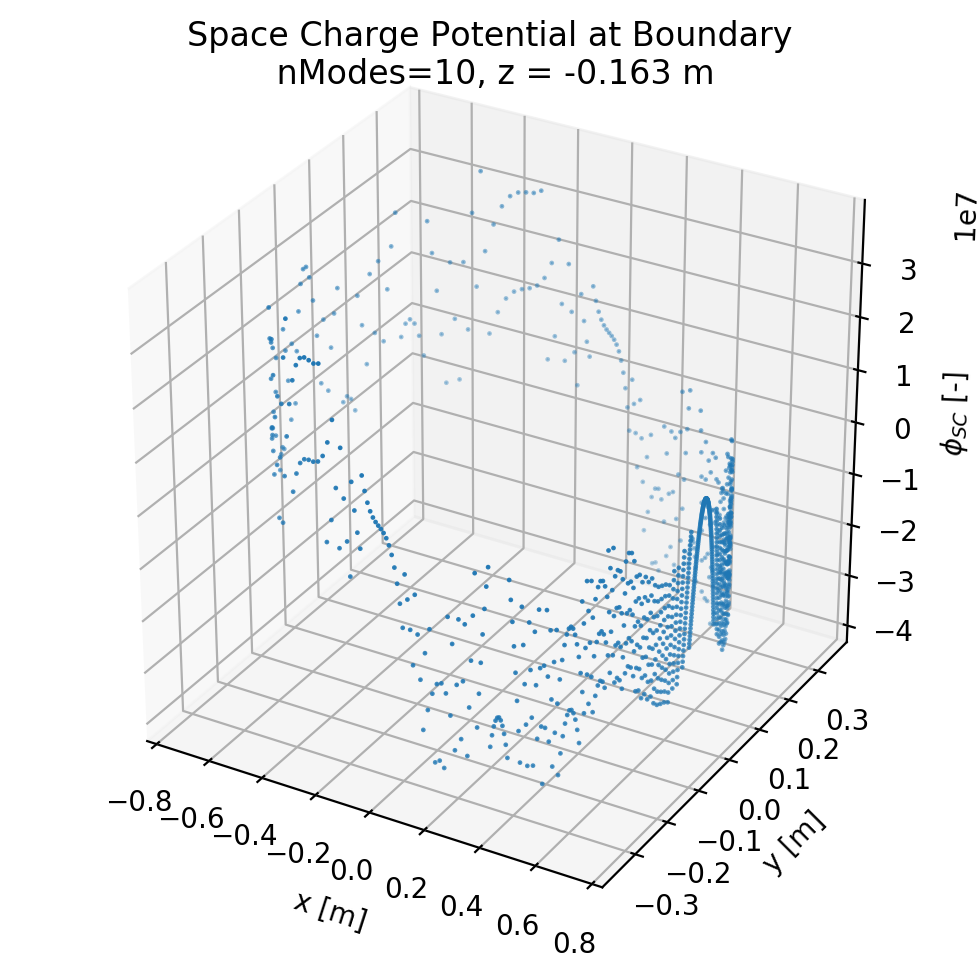

In [11]:
nModes10.plot_elliptical_boundary_scatter(nModes10.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=10', save=True, savename='Phi_Elliptical_boundary_scatter_nModes10.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.17421411854492774
Nearest neighbours =  0.73 0.0017073170731707332 -0.17421411854492774
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.17421411854492774
Nearest neighbours =  0.73 -0.0017073170731707332 -0.17421411854492774


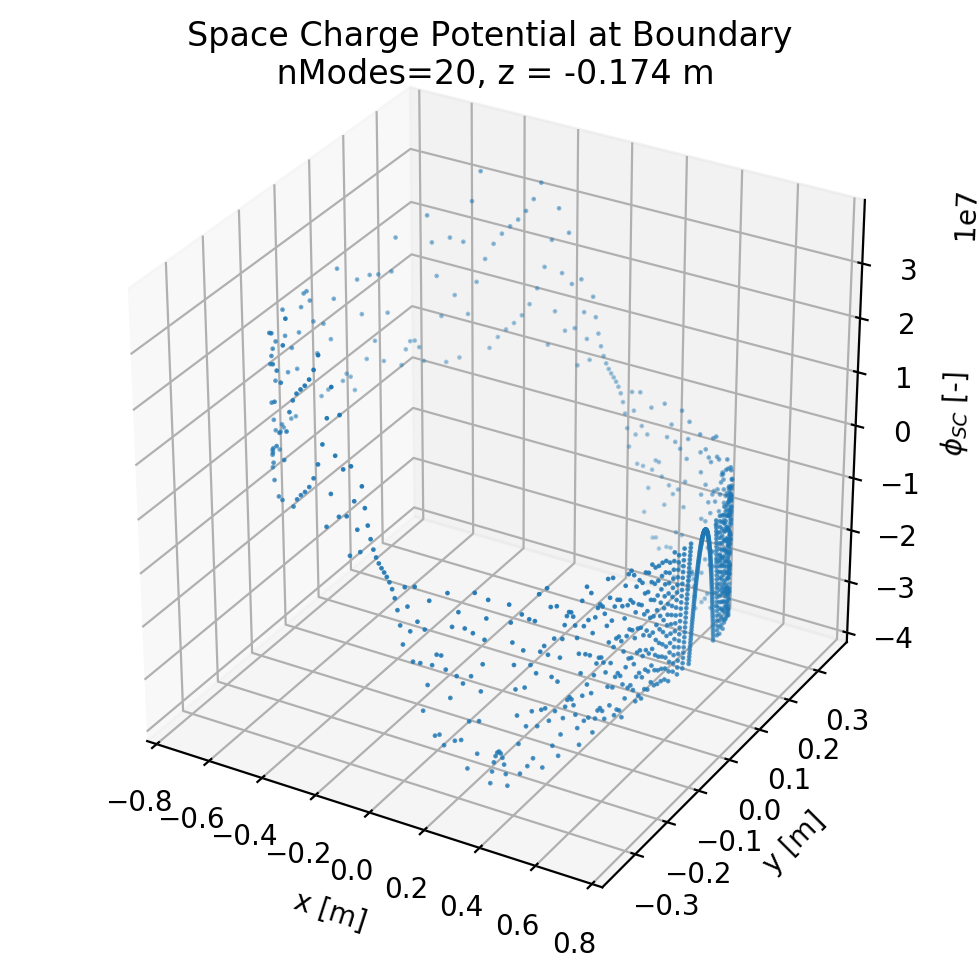

In [12]:
nModes20.plot_elliptical_boundary_scatter(nModes20.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=20', save=True, savename='Phi_Elliptical_boundary_scatter_nModes20.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.17301967651884453
Nearest neighbours =  0.73 0.0017073170731707332 -0.17301967651884453
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.17301967651884453
Nearest neighbours =  0.73 -0.0017073170731707332 -0.17301967651884453


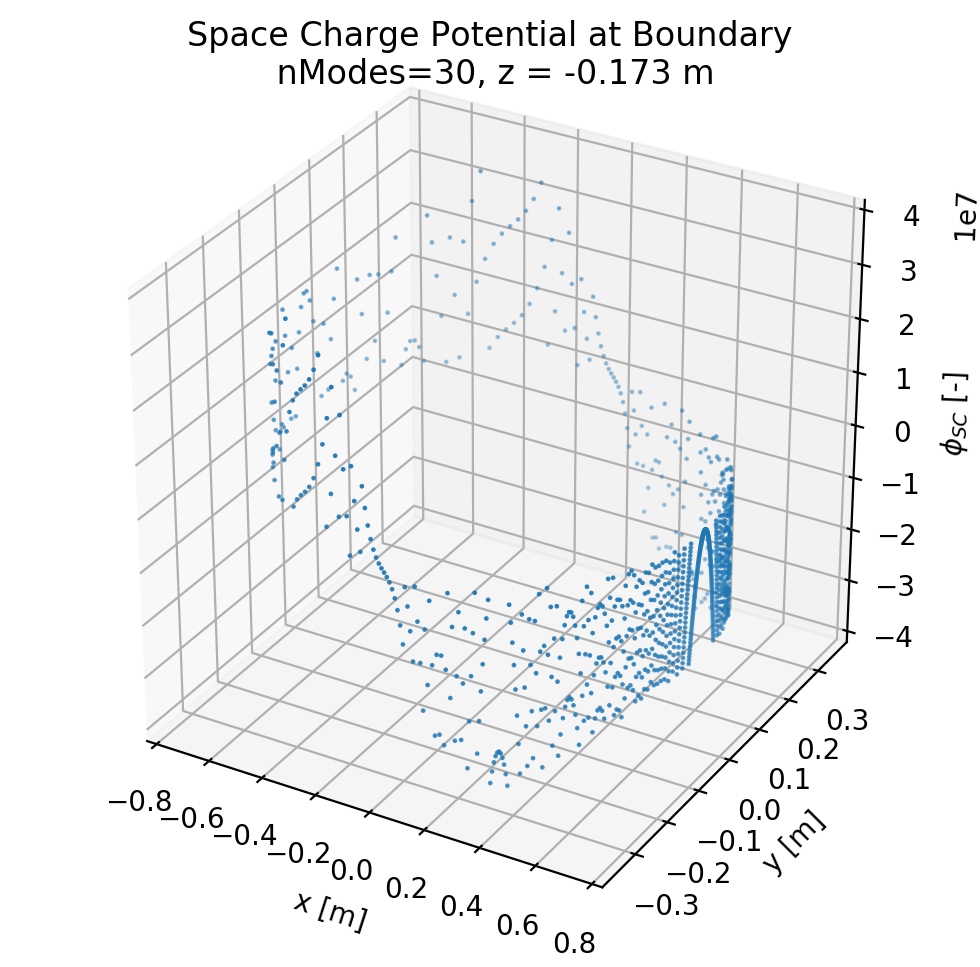

In [13]:
nModes30.plot_elliptical_boundary_scatter(nModes30.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=30', save=True, savename='Phi_Elliptical_boundary_scatter_nModes30.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.16722174452247884
Nearest neighbours =  0.73 0.0017073170731707332 -0.16722174452247884
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.16722174452247884
Nearest neighbours =  0.73 -0.0017073170731707332 -0.16722174452247884


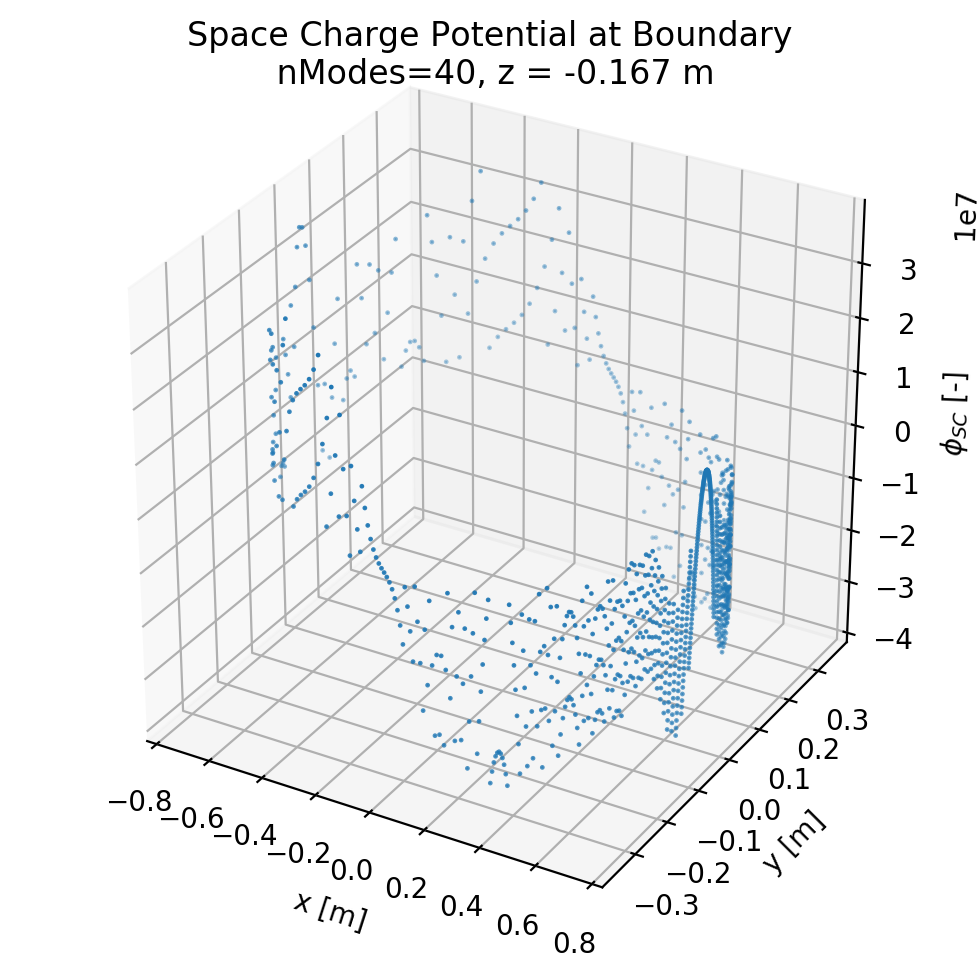

In [14]:
nModes40.plot_elliptical_boundary_scatter(nModes40.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=40', save=True, savename='Phi_Elliptical_boundary_scatter_nModes40.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.16192296714551802
Nearest neighbours =  0.73 0.0017073170731707332 -0.16192296714551802
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.16192296714551802
Nearest neighbours =  0.73 -0.0017073170731707332 -0.16192296714551802


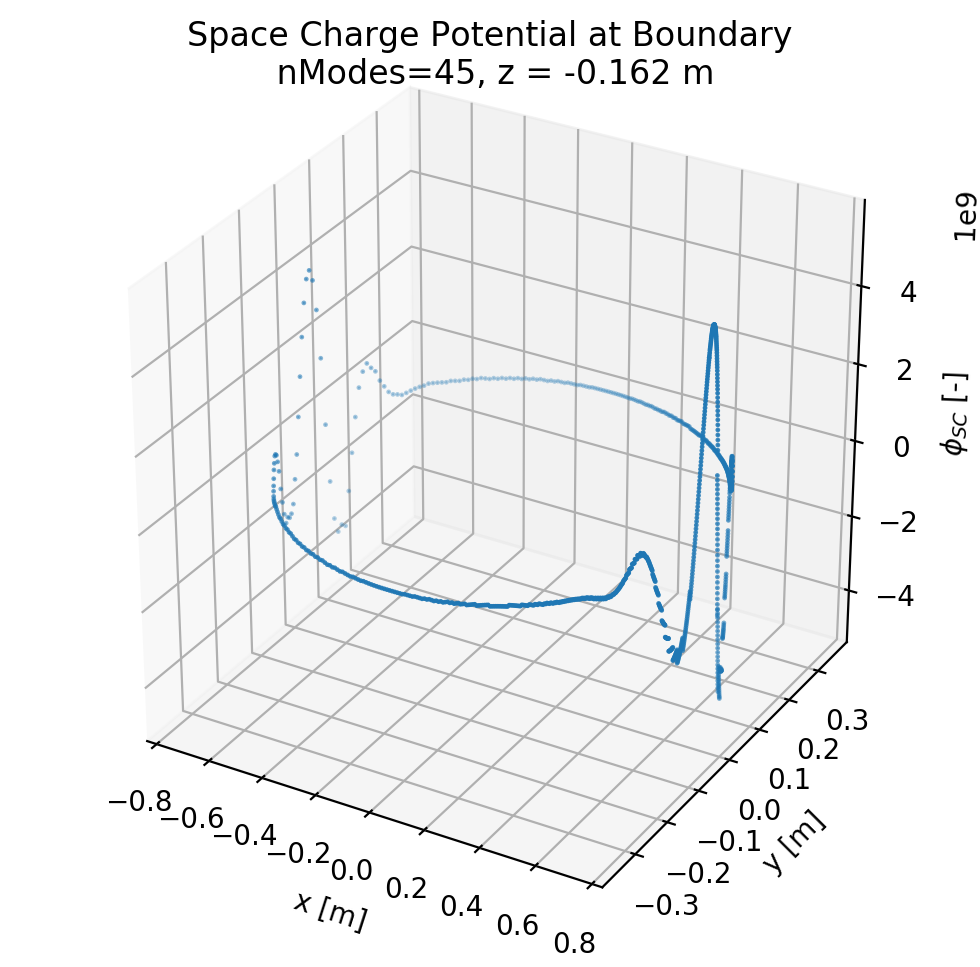

In [15]:
nModes45.plot_elliptical_boundary_scatter(nModes45.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=45', save=True, savename='Phi_Elliptical_boundary_scatter_nModes45.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.17912781633275898
Nearest neighbours =  0.73 0.0017073170731707332 -0.17912781633275898
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.17912781633275898
Nearest neighbours =  0.73 -0.0017073170731707332 -0.17912781633275898


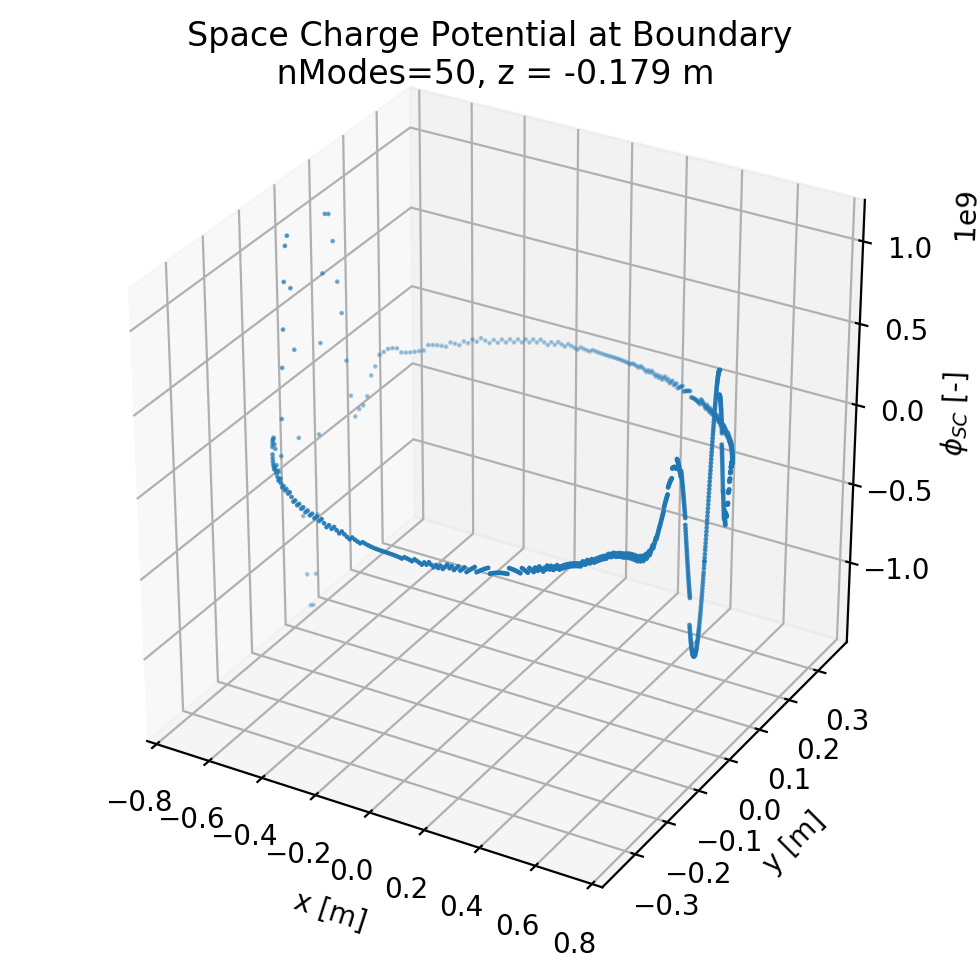

In [16]:
nModes50.plot_elliptical_boundary_scatter(nModes50.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=50', save=True, savename='Phi_Elliptical_boundary_scatter_nModes50.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.1675513025712796
Nearest neighbours =  0.73 0.0017073170731707332 -0.1675513025712796
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.1675513025712796
Nearest neighbours =  0.73 -0.0017073170731707332 -0.1675513025712796


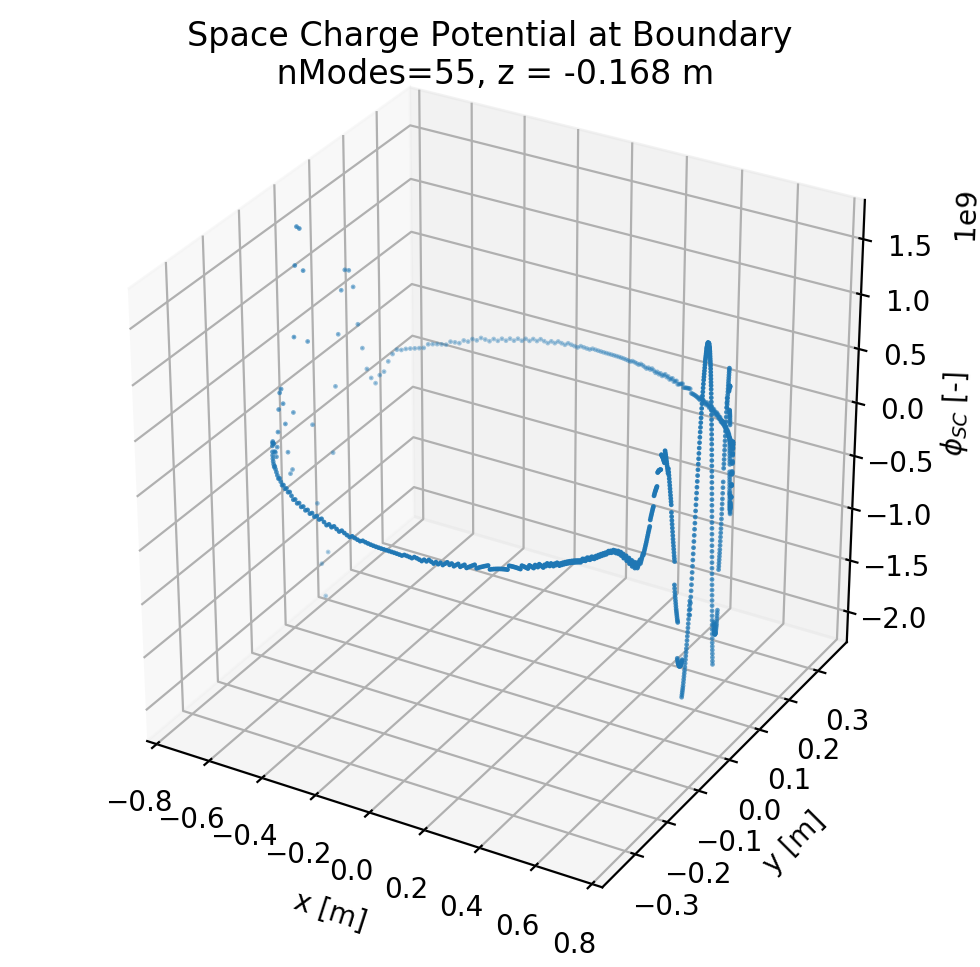

In [17]:
nModes55.plot_elliptical_boundary_scatter(nModes55.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=55', save=True, savename='Phi_Elliptical_boundary_scatter_nModes55.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.16468066229760225
Nearest neighbours =  0.73 0.0017073170731707332 -0.16468066229760225
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.16468066229760225
Nearest neighbours =  0.73 -0.0017073170731707332 -0.16468066229760225


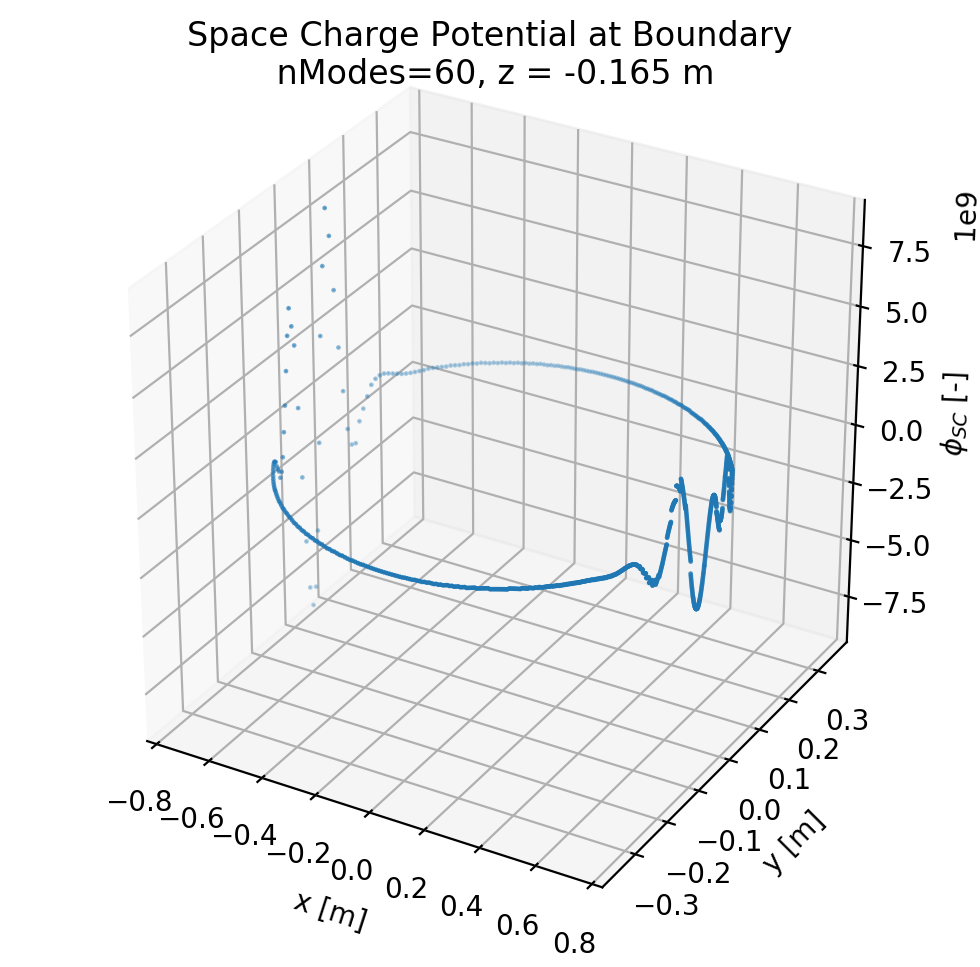

In [18]:
nModes60.plot_elliptical_boundary_scatter(nModes60.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=60', save=True, savename='Phi_Elliptical_boundary_scatter_nModes60.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.16515122978578134
Nearest neighbours =  0.73 0.0017073170731707332 -0.16515122978578134
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.16515122978578134
Nearest neighbours =  0.73 -0.0017073170731707332 -0.16515122978578134


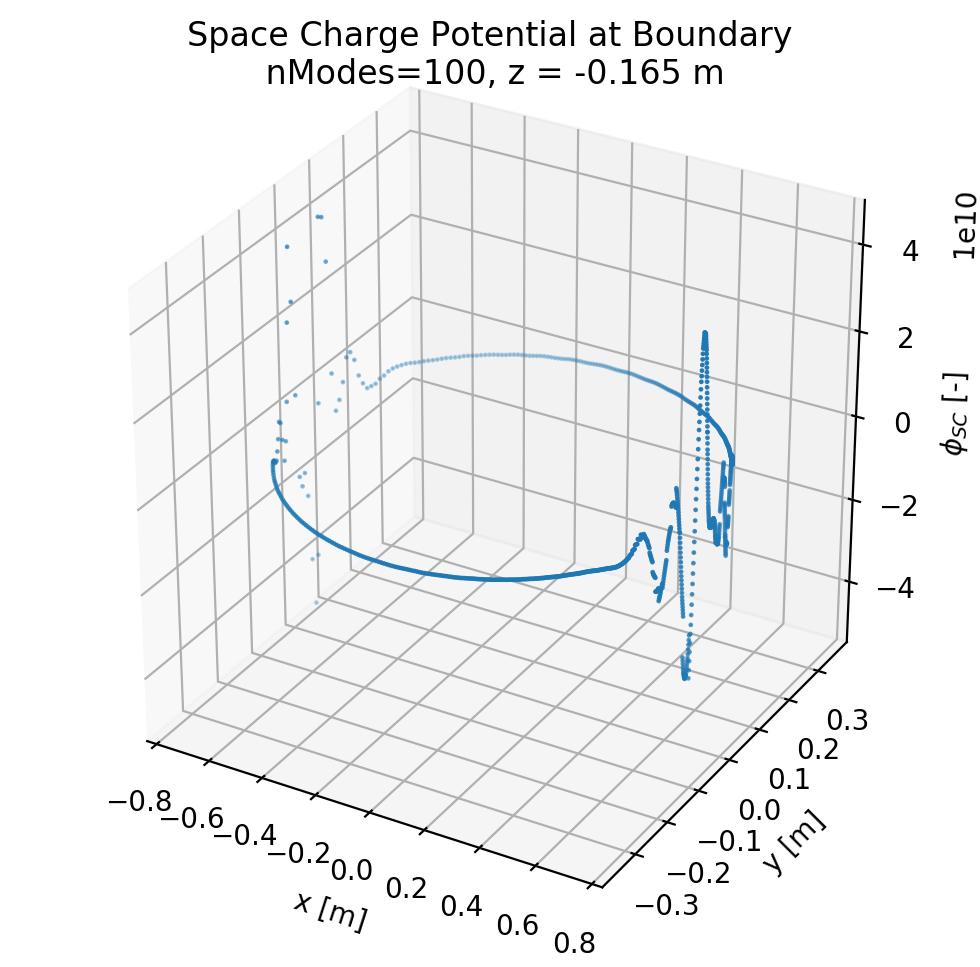

In [19]:
nModes100.plot_elliptical_boundary_scatter(nModes100.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=100', save=True, savename='Phi_Elliptical_boundary_scatter_nModes100.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.1645269709884971
Nearest neighbours =  0.73 0.0017073170731707332 -0.1645269709884971
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.1645269709884971
Nearest neighbours =  0.73 -0.0017073170731707332 -0.1645269709884971


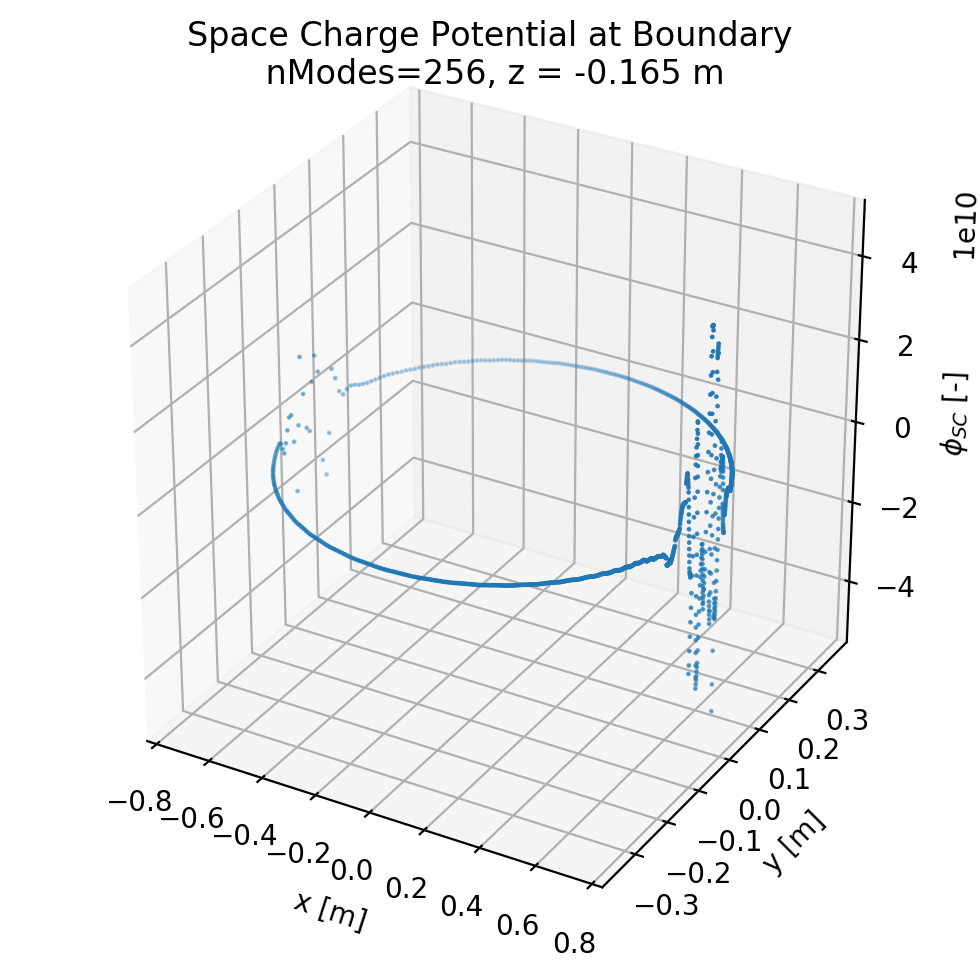

In [20]:
nModes256.plot_elliptical_boundary_scatter(nModes256.get_central_z_index(), semi_major, semi_minor, npoints=1024, title='Space Charge Potential at Boundary\n', label='nModes=256', save=True, savename='Phi_Elliptical_boundary_scatter_nModes256.png')

# Plot boundary phi in polar co-ordinates

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.17406687748563954
Nearest neighbours =  0.73 0.0017073170731707332 -0.17406687748563954
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.17406687748563954
Nearest neighbours =  0.73 -0.0017073170731707332 -0.17406687748563954


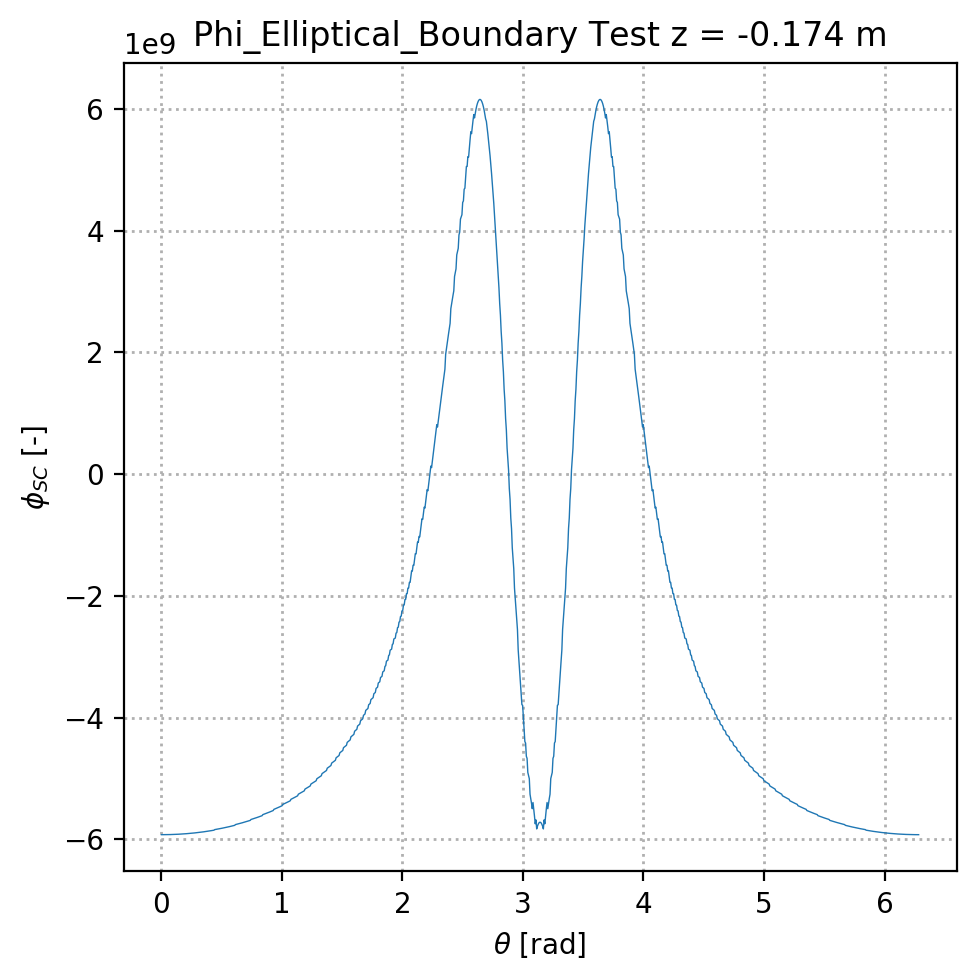

In [250]:
nModes1.plot_elliptical_boundary(31, semi_major, semi_minor, npoints=1024, title='Phi_Elliptical_Boundary', label=main_label, save=False, savename='Phi_Elliptical_boundary_nModes1.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.17169533946112026
Nearest neighbours =  0.73 0.0017073170731707332 -0.17169533946112026
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.17169533946112026
Nearest neighbours =  0.73 -0.0017073170731707332 -0.17169533946112026


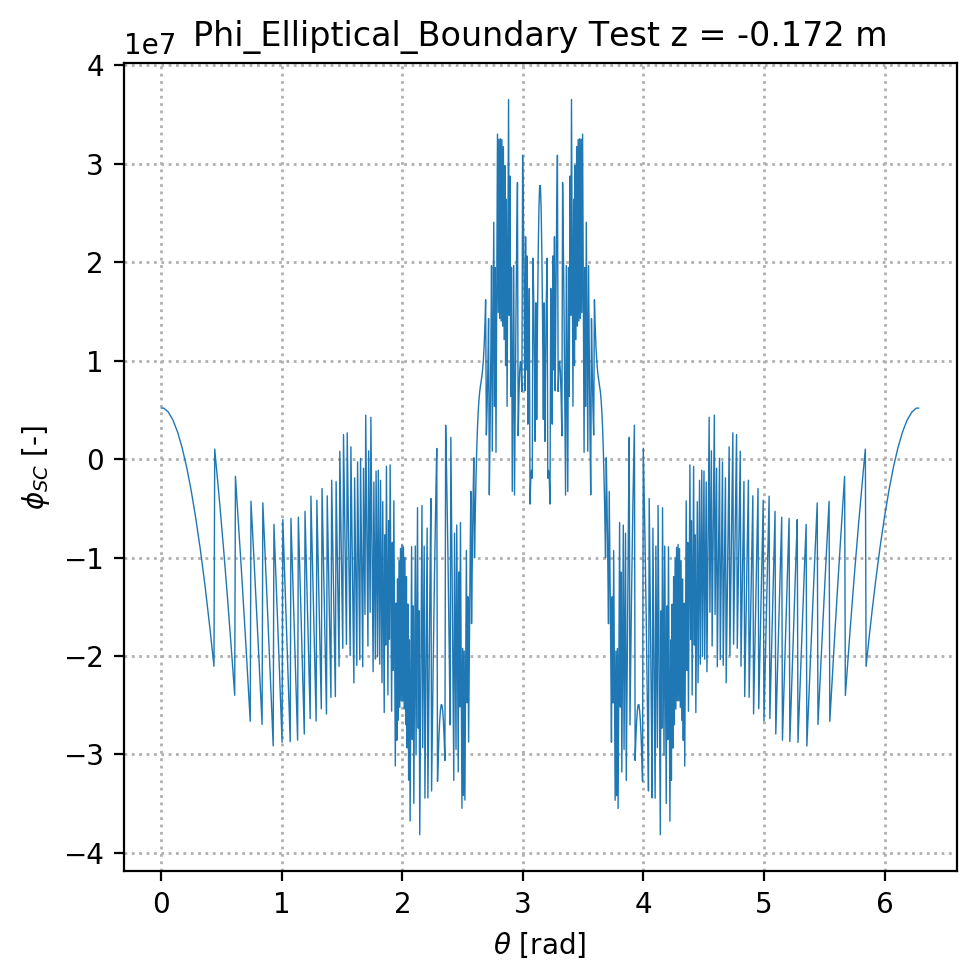

In [251]:
nModes10.plot_elliptical_boundary(31, semi_major, semi_minor, npoints=1024, title='Phi_Elliptical_Boundary', label=main_label, save=False, savename='Phi_Elliptical_boundary_nModes10.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.1701905598558362
Nearest neighbours =  0.73 0.0017073170731707332 -0.1701905598558362
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.1701905598558362
Nearest neighbours =  0.73 -0.0017073170731707332 -0.1701905598558362


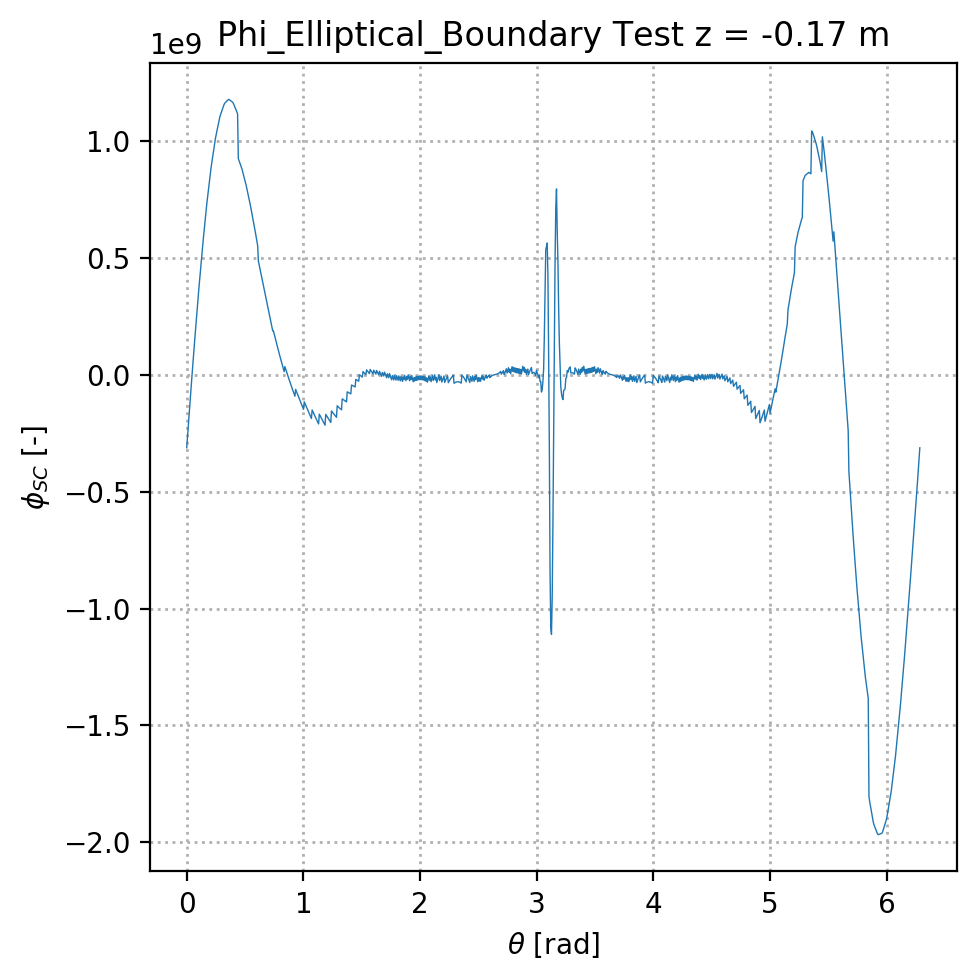

In [252]:
nModes50.plot_elliptical_boundary(31, semi_major, semi_minor, npoints=1024, title='Phi_Elliptical_Boundary', label=main_label, save=False, savename='Phi_Elliptical_boundary_nModes50.png')

Ellipse eccentricity =  0.8775680755094228
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 0.0016468456967905138 -0.16152785280945636
Nearest neighbours =  0.73 0.0017073170731707332 -0.16152785280945636
PhiGrid::get_interpolated_phi_xyz_co_ordinate: Interpolation not required as co-ordinate within tolerance to nearest data point
Requested co-ordinates =  0.72999191900202 -0.0016468456967905064 -0.16152785280945636
Nearest neighbours =  0.73 -0.0017073170731707332 -0.16152785280945636


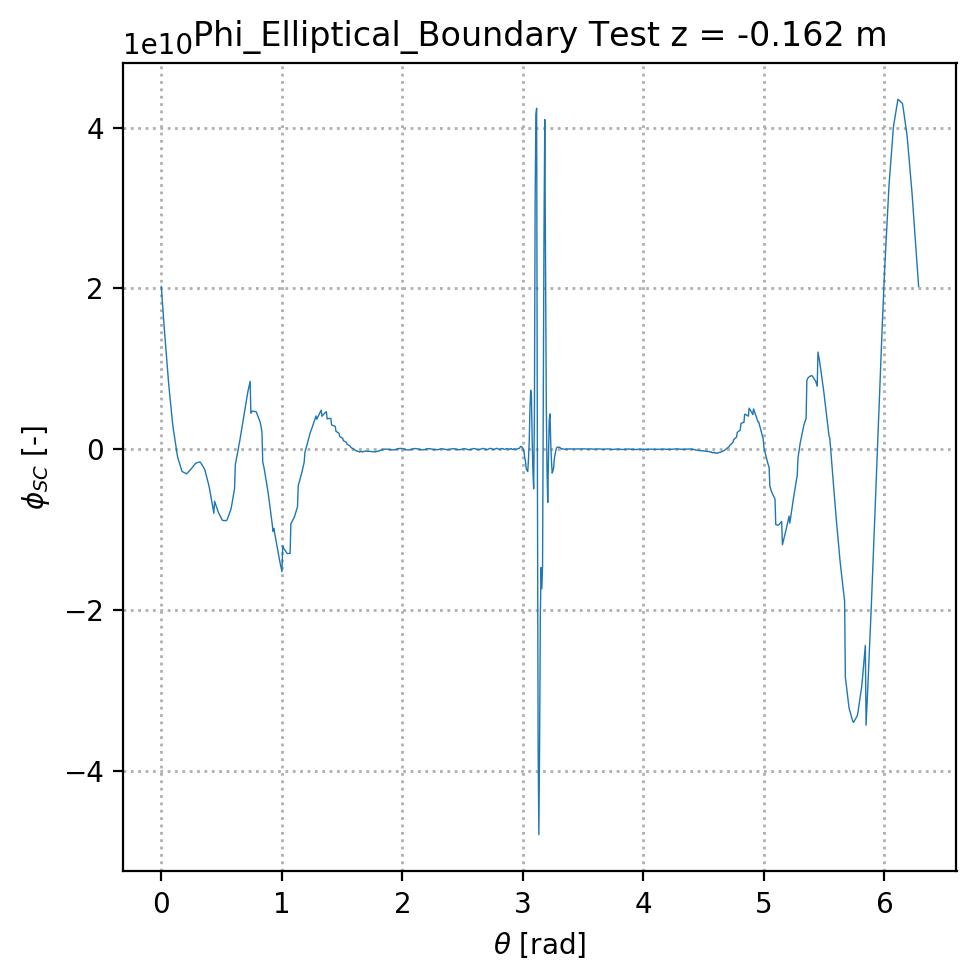

In [253]:
nModes100.plot_elliptical_boundary(31, semi_major, semi_minor, npoints=1024, title='Phi_Elliptical_Boundary', label=main_label, save=False, savename='Phi_Elliptical_boundary_nModes100.png')

# Check phi slice at centre z slice, y = boundary

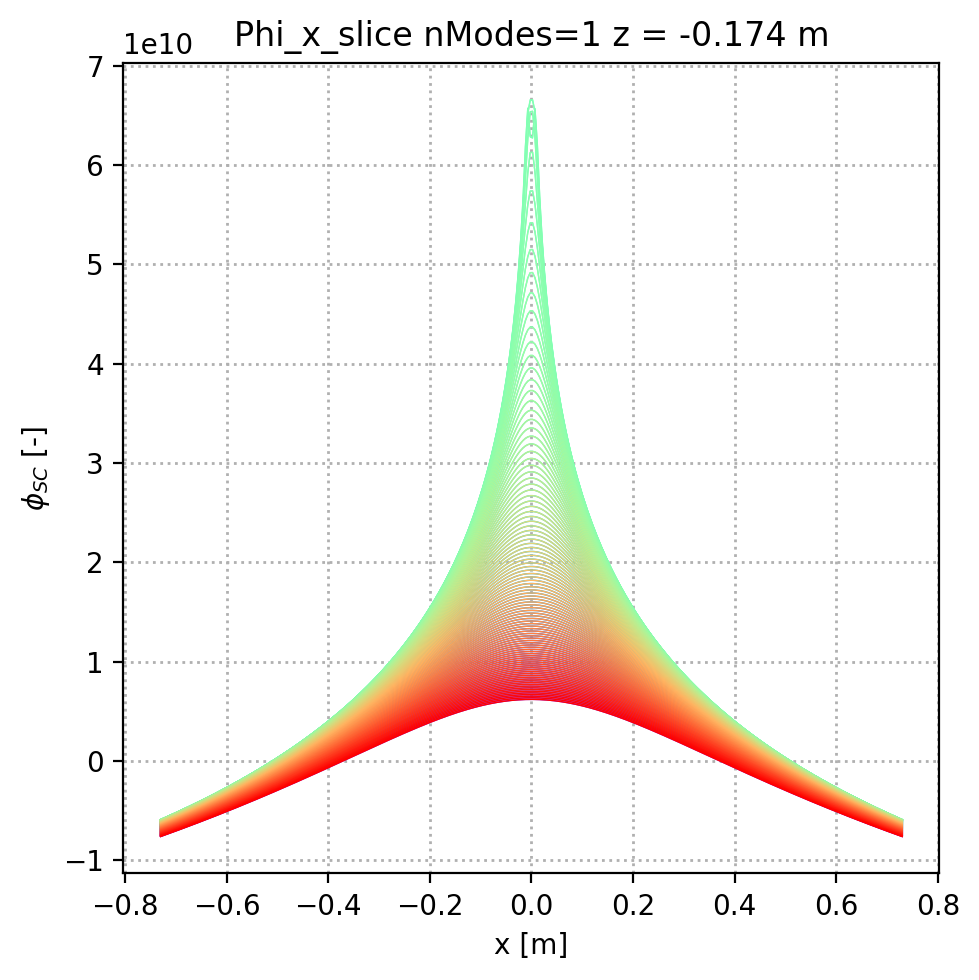

In [233]:
nModes1.plot_x_phi_all_y_slices(31, title='Phi_x all y slices', label='nModes=1', save=False, savename='Phi_x_All_y_Slices_nModes1.png')   

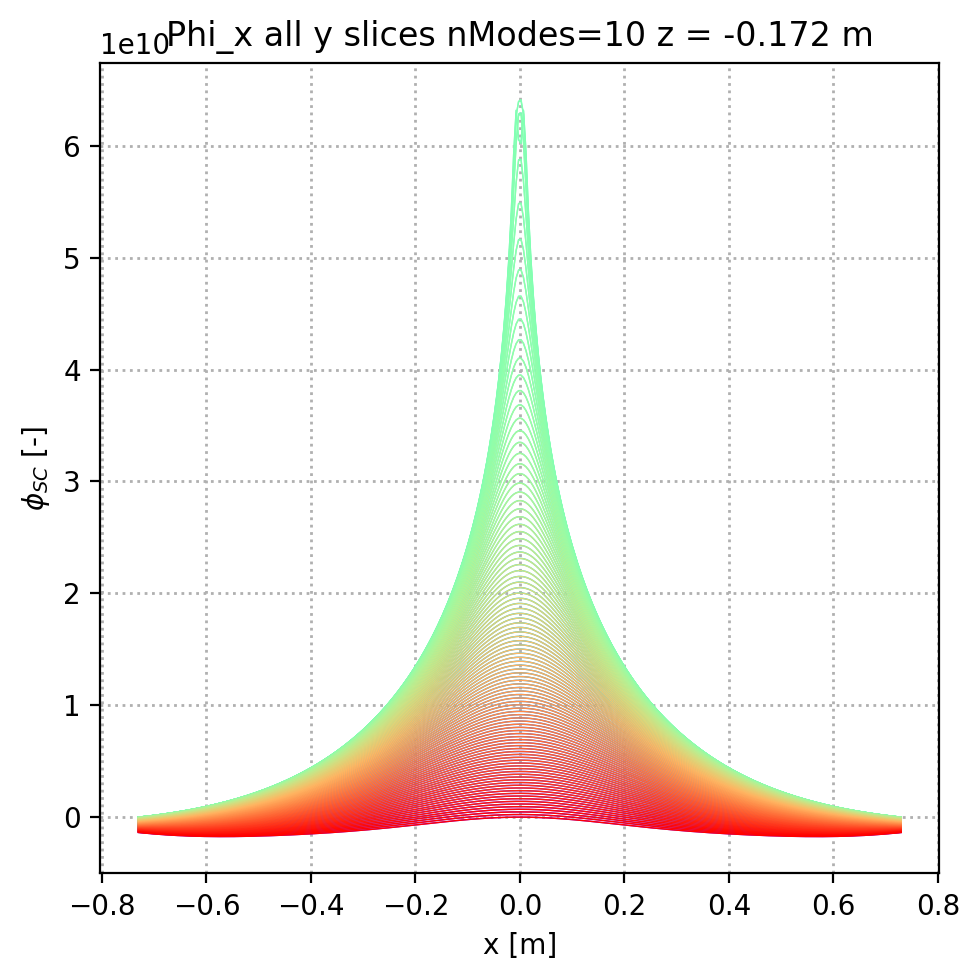

In [234]:
nModes10.plot_x_phi_all_y_slices(31, title='Phi_x all y slices', label='nModes=10', save=False, savename='Phi_x_All_y_Slices_nModes10.png')   

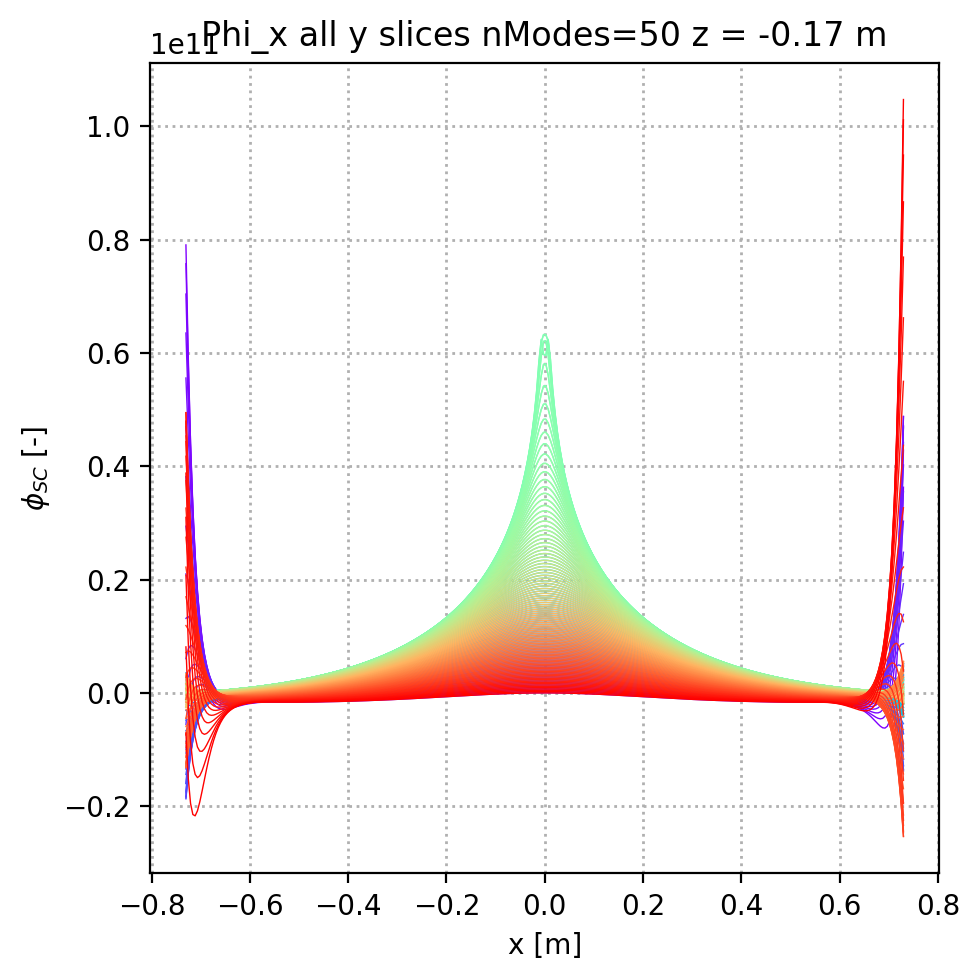

In [235]:
nModes50.plot_x_phi_all_y_slices(31, title='Phi_x all y slices', label='nModes=50', save=False, savename='Phi_x_All_y_Slices_nModes50.png')   

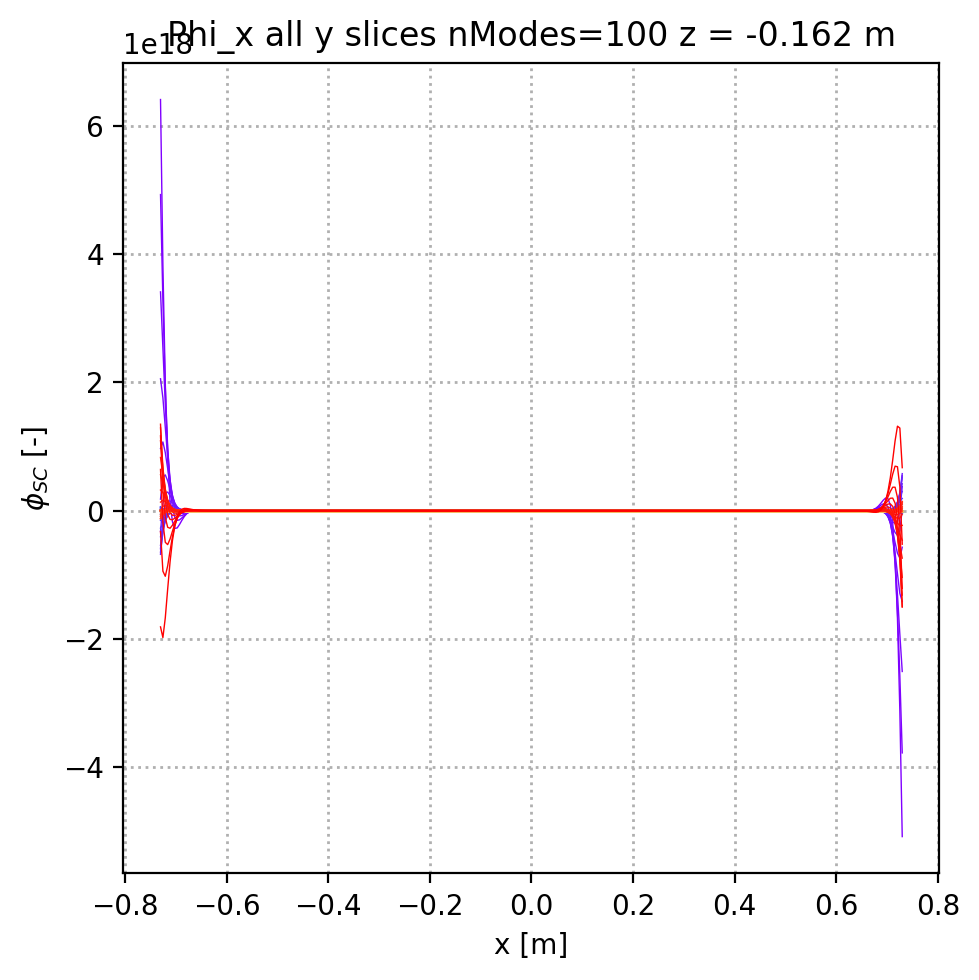

In [236]:
nModes100.plot_x_phi_all_y_slices(31, title='Phi_x all y slices', label='nModes=100', save=False, savename='Phi_x_All_y_Slices_nModes100.png')   

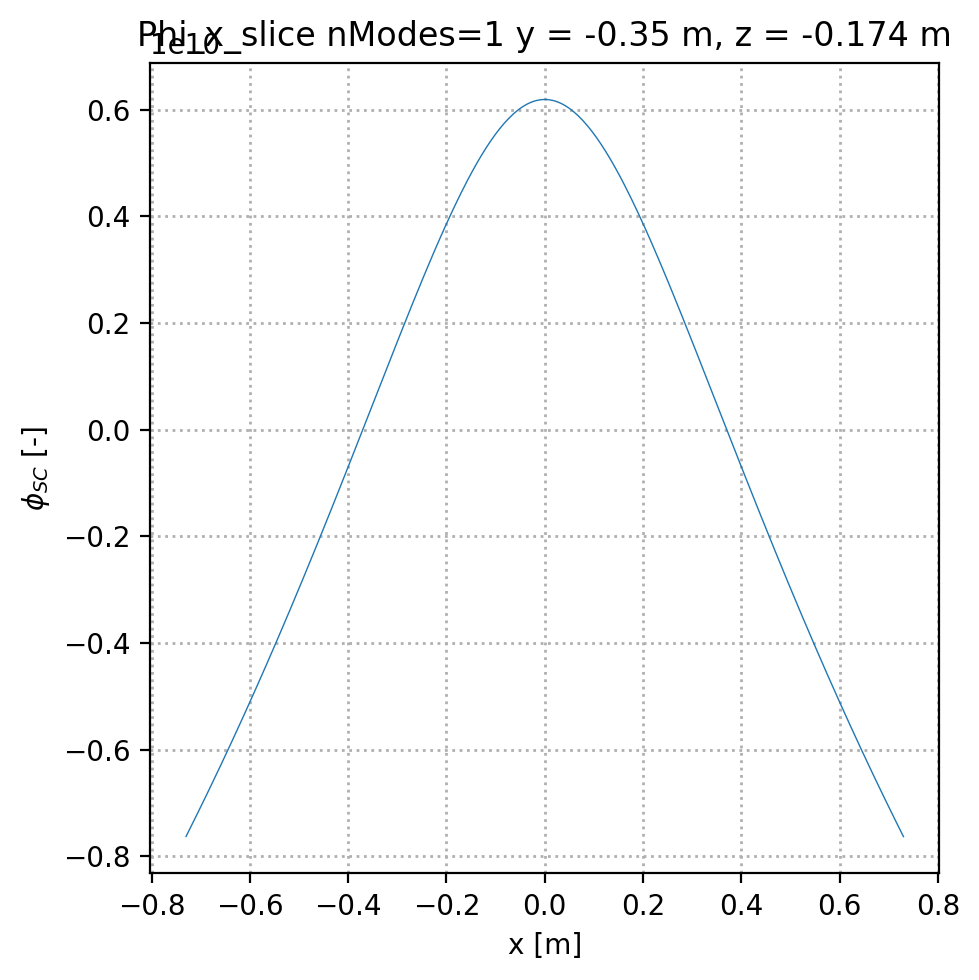

In [203]:
nModes1.plot_x_phi_slice(0, 31, title='Phi_x_slice', label='nModes=1', save=False, savename='Phi_Slice_x_nmodes1.png')

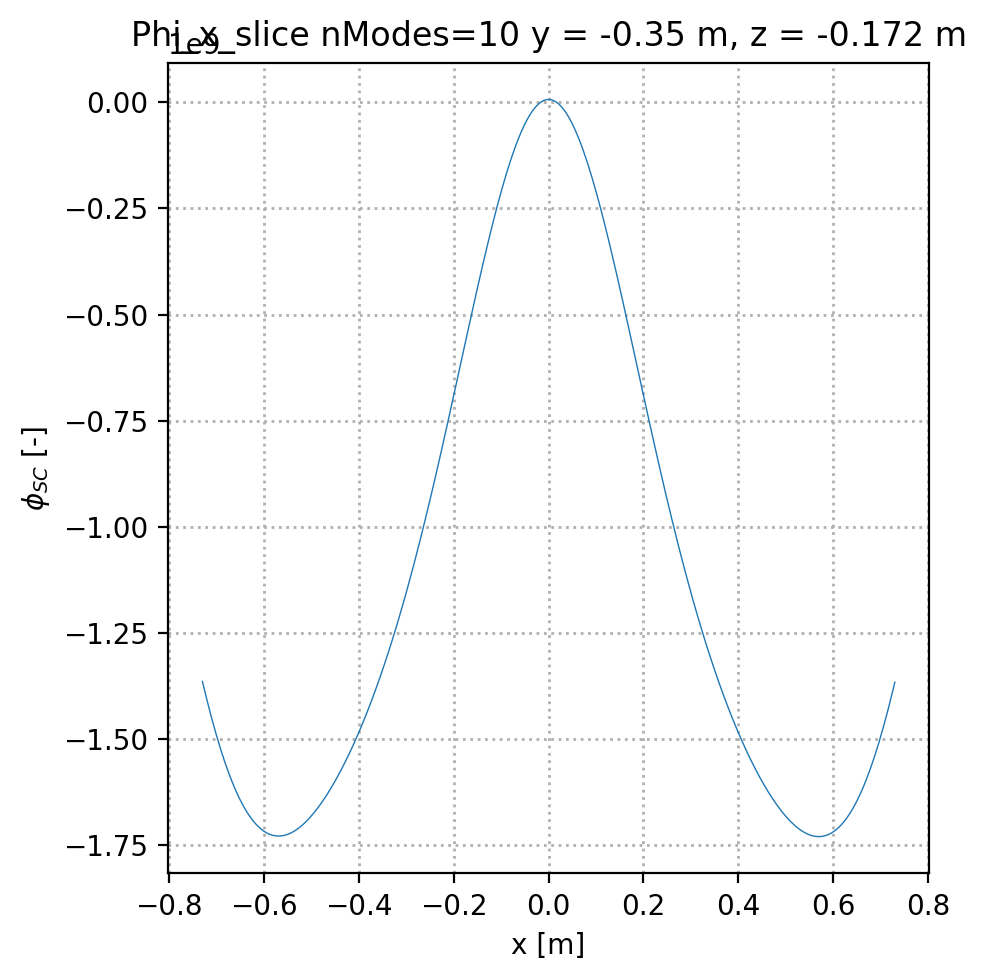

In [204]:
nModes10.plot_x_phi_slice(0, 31, title='Phi_x_slice', label='nModes=10', save=False, savename='Phi_Slice_x_nmodes10.png')

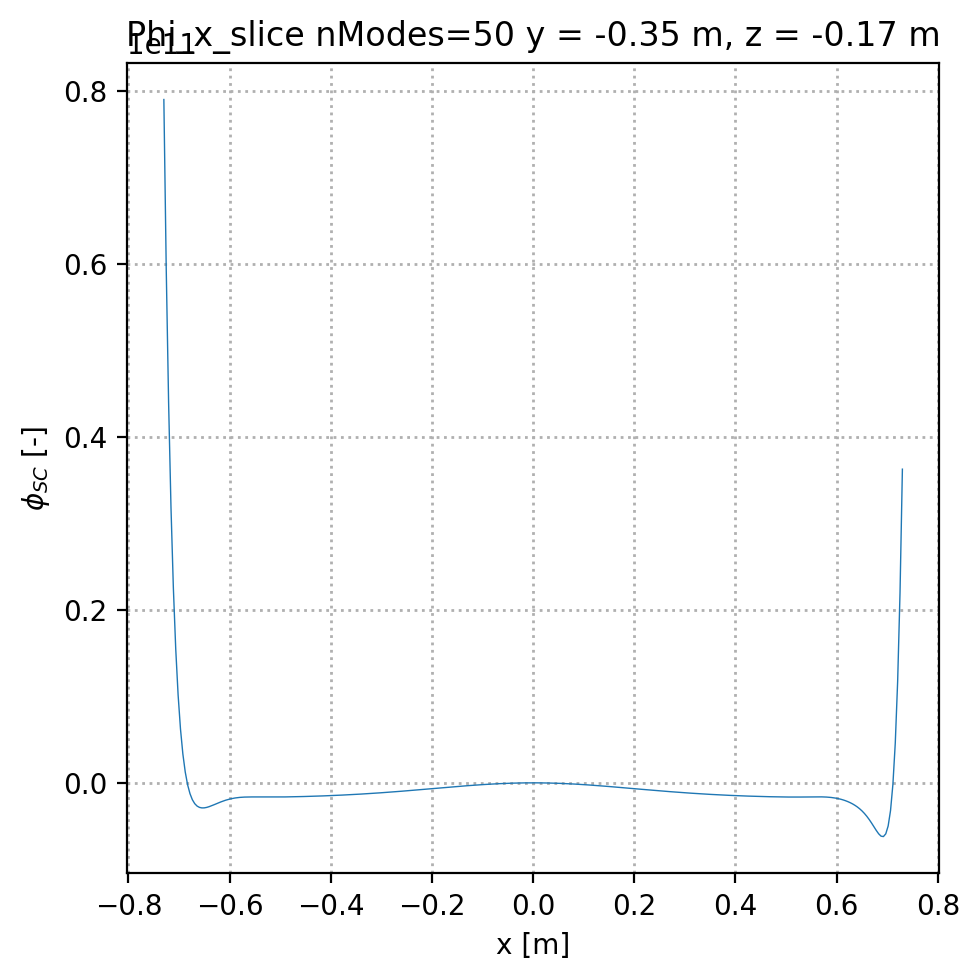

In [205]:
nModes50.plot_x_phi_slice(0, 31, title='Phi_x_slice', label='nModes=50', save=False, savename='Phi_Slice_x_nmodes50.png')

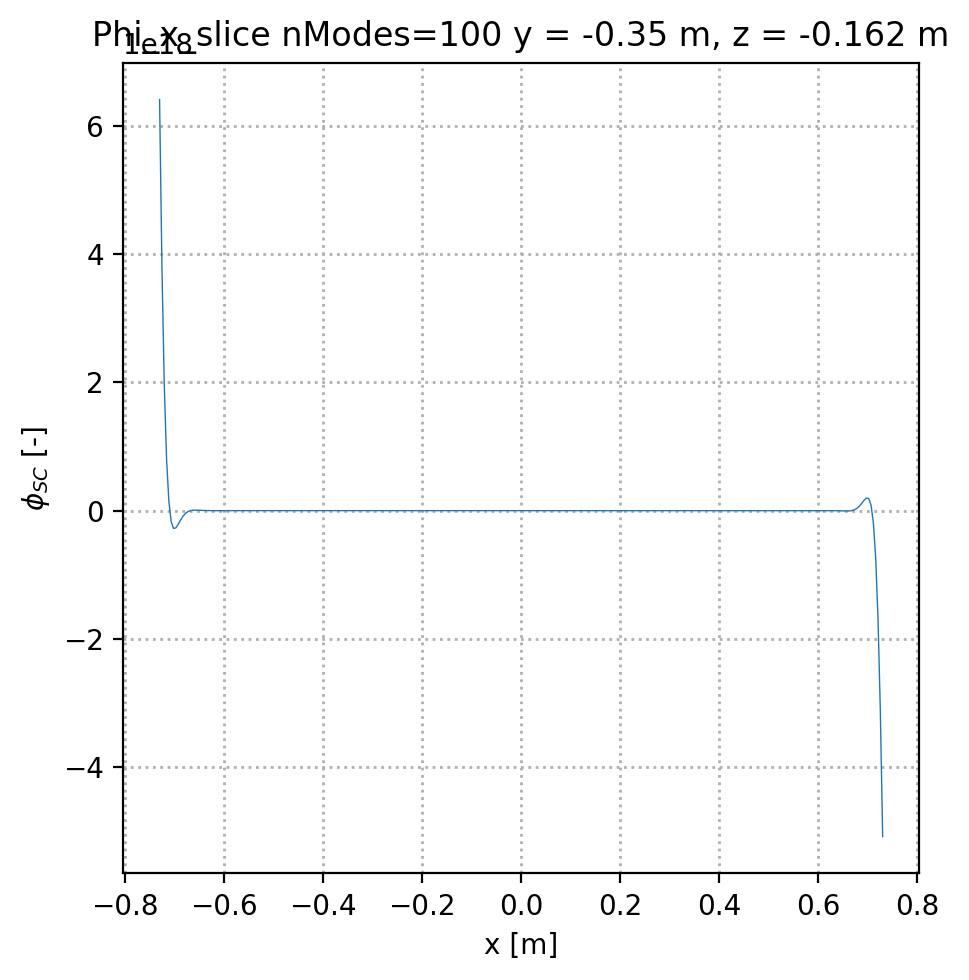

In [206]:
nModes100.plot_x_phi_slice(0, 31, title='Phi_x_slice', label='nModes=100', save=False, savename='Phi_Slice_x_nmodes100.png')

# Plot potential at centre z slice

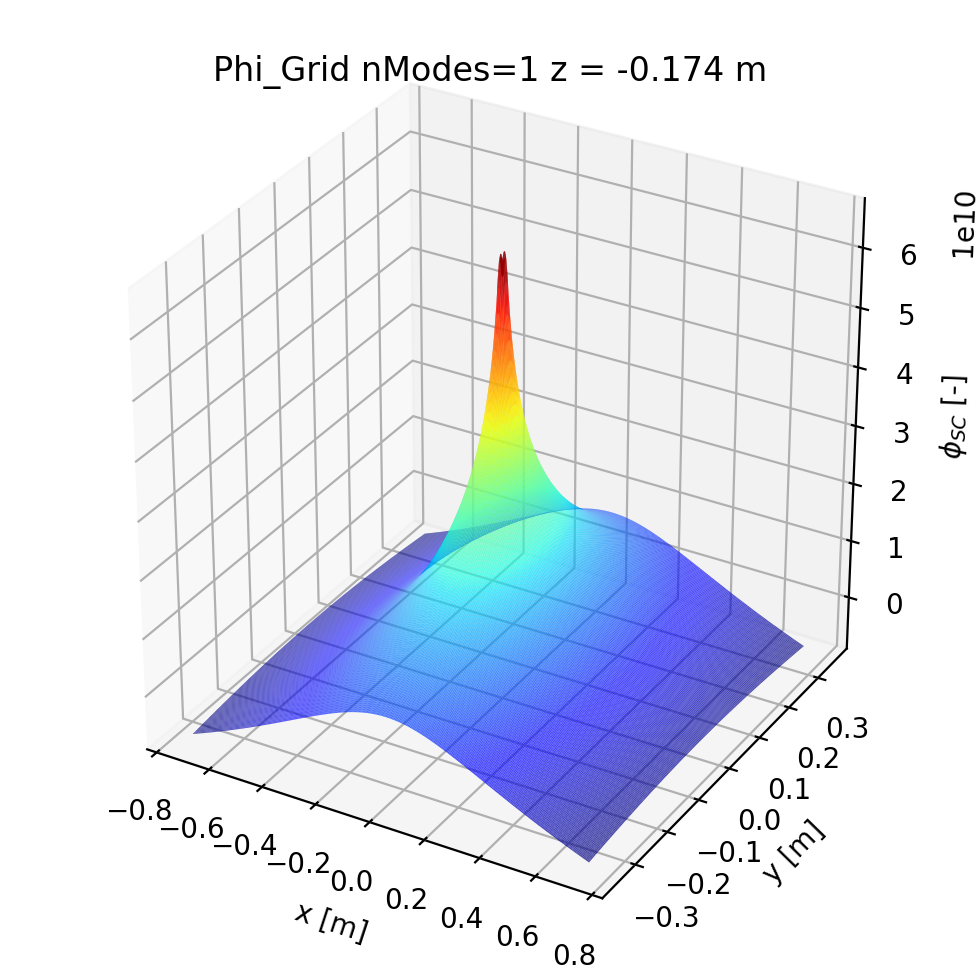

In [207]:
nModes1.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=1', save=False, savename='Phi_Grid_xy_nmodes1.png')

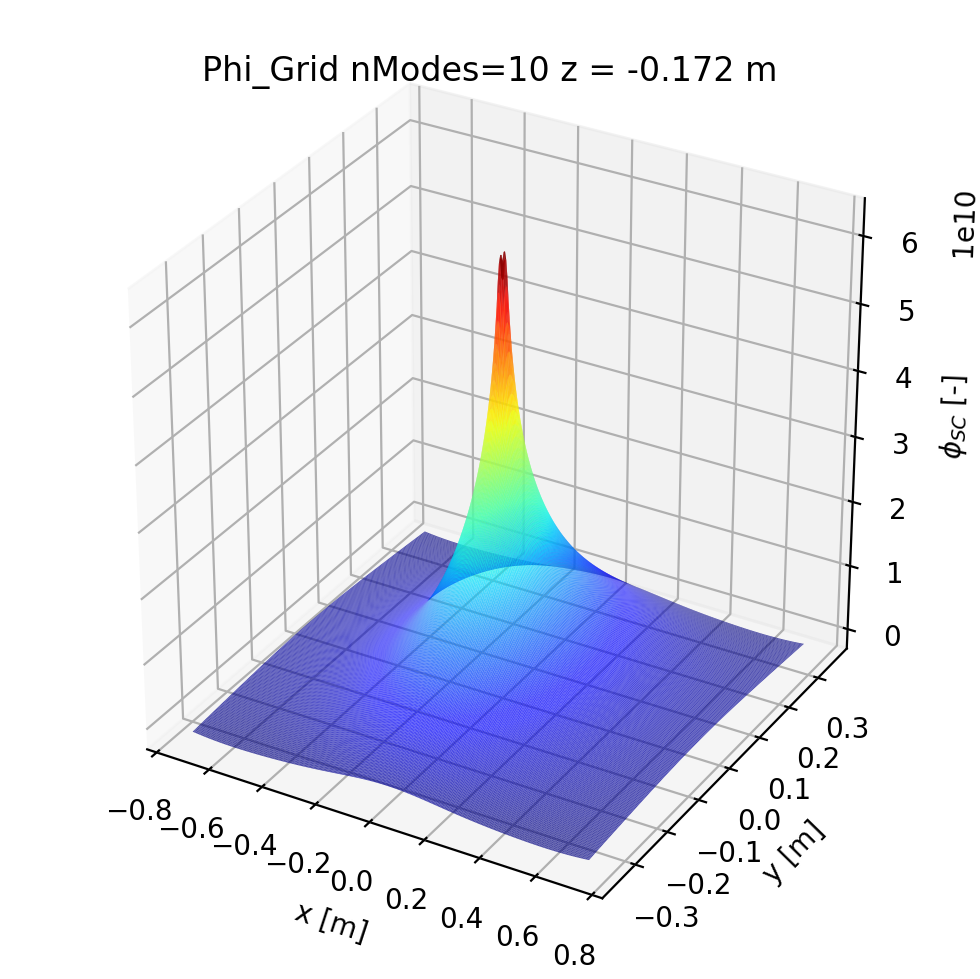

In [208]:
nModes10.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=10', save=False, savename='Phi_Grid_xy_nmodes10.png')

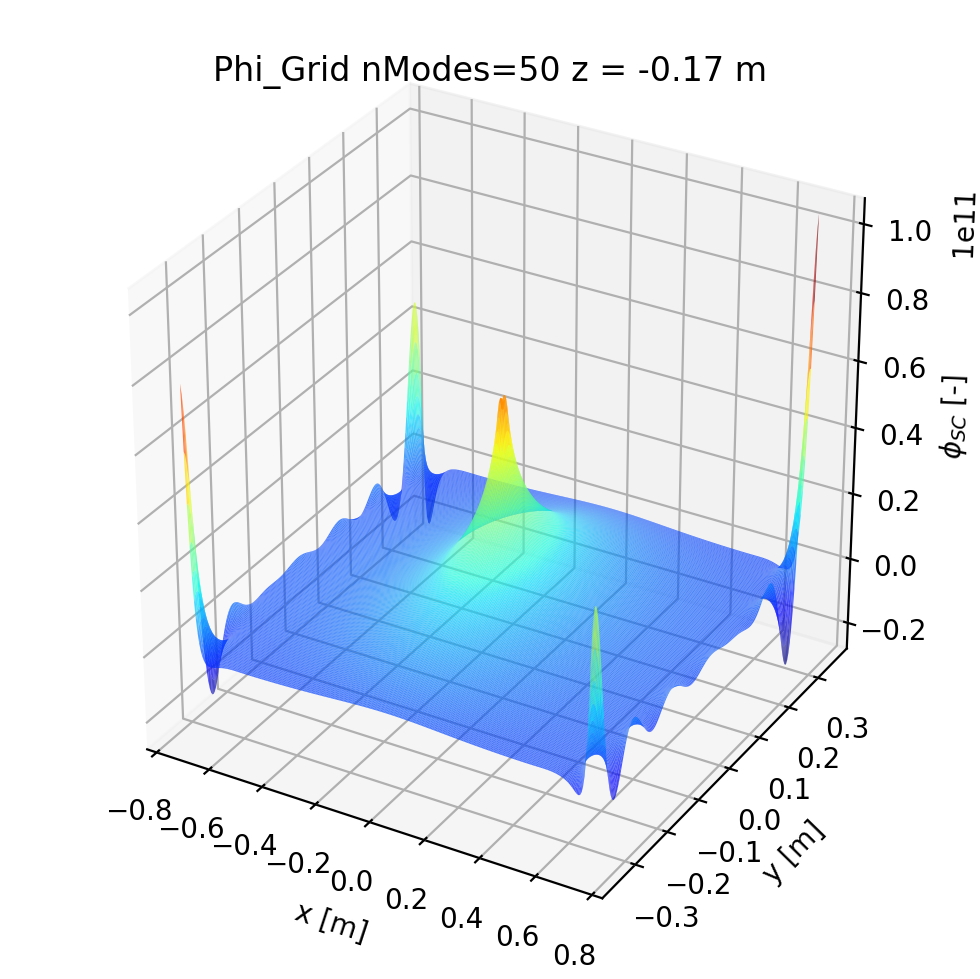

In [209]:
nModes50.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=50', save=False, savename='Phi_Grid_xy_nmodes50.png')

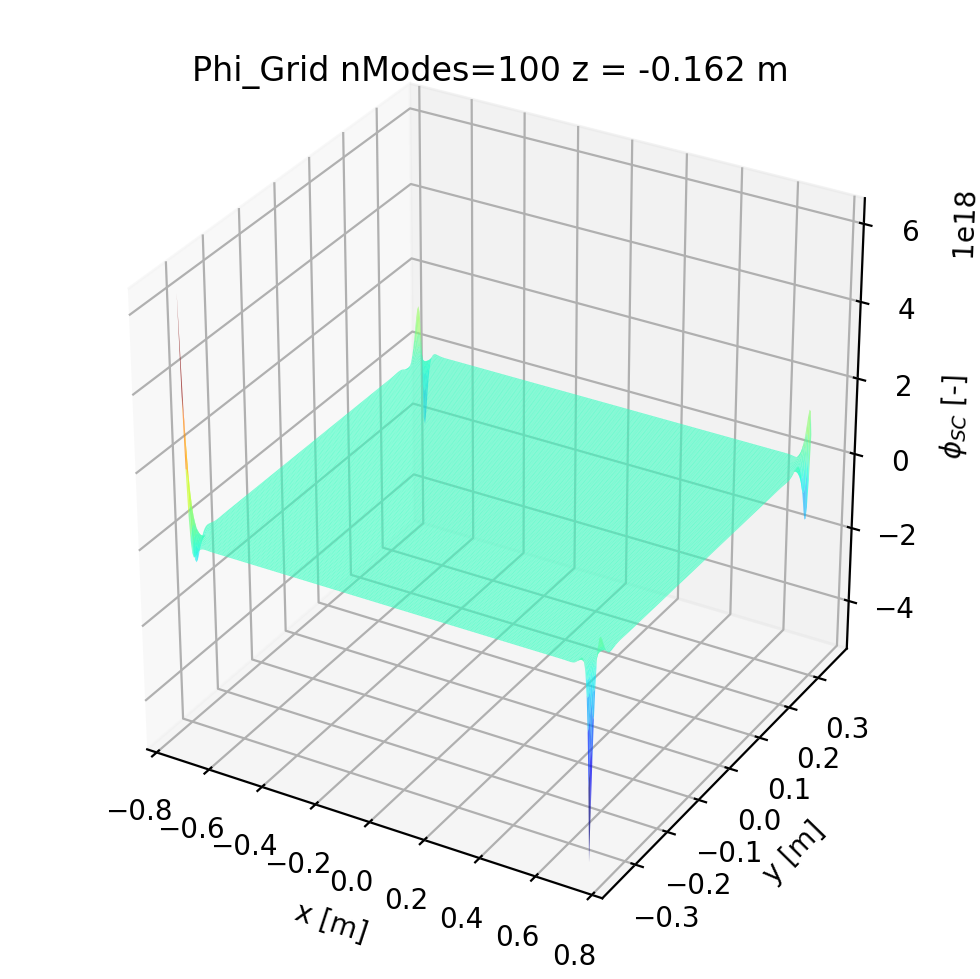

In [210]:
nModes100.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=100', save=False, savename='Phi_Grid_xy_nmodes100.png')

## Import Data - our grid is 312 * 206 * 64 with indirect SC

In [9]:
dd_rho = dict()
dd_rho = add_rho_file(dd_rho, '1_1_1/space_charge_output/Rho_grid_0.mat', 'Rho')

dd_phi = dict()
dd_phi = add_rho_file(dd_phi, '1_1_1/space_charge_output/Phi_grid_0.mat', 'Phi')

	Added output data from  1_1_1/space_charge_output/Rho_grid_0.mat 	 dictionary key:  Rho
	Added output data from  1_1_1/space_charge_output/Phi_grid_0.mat 	 dictionary key:  Phi


In [10]:
dd_rho['Rho'].keys()

['y_grid',
 'z_grid',
 '__header__',
 'Ey_grid',
 '__globals__',
 'Ex_grid',
 'Ez_grid',
 'rho_grid',
 '__version__',
 'x_grid']

In [458]:
test = PhiGrid('1_1_1/space_charge_output_original/Phi_grid_0.mat', 'nModes=10')

PhiGrid::initialise_data: Added output data from  1_1_1/space_charge_output_original/Phi_grid_0.mat 	 dictionary label:  nModes=10
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64


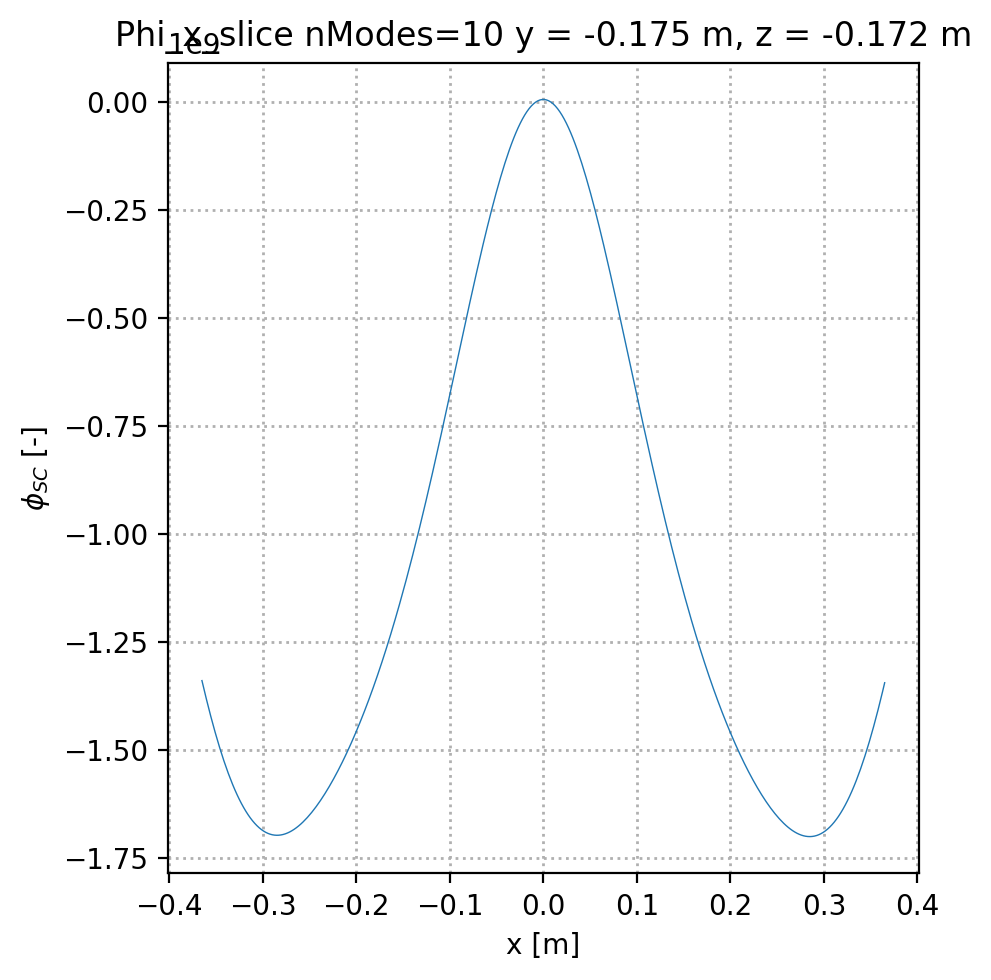

1

In [459]:
test.plot_x_phi_slice(0, 31, title='Phi_x_slice', label='nModes=10', save=False, savename='Phi_Slice_x_nmodes10.png')

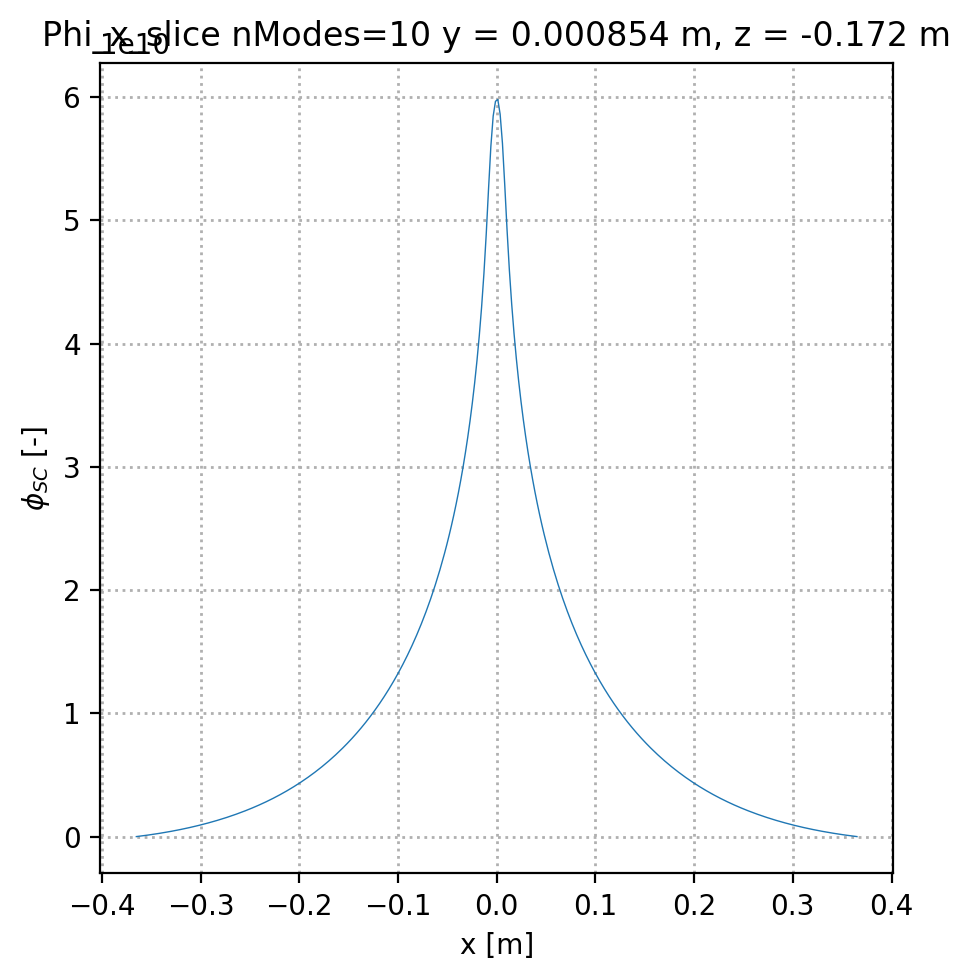

1

In [461]:
test.plot_x_phi_slice(103, 31, title='Phi_x_slice', label='nModes=10', save=False, savename='Phi_Slice_x_nmodes10.png')

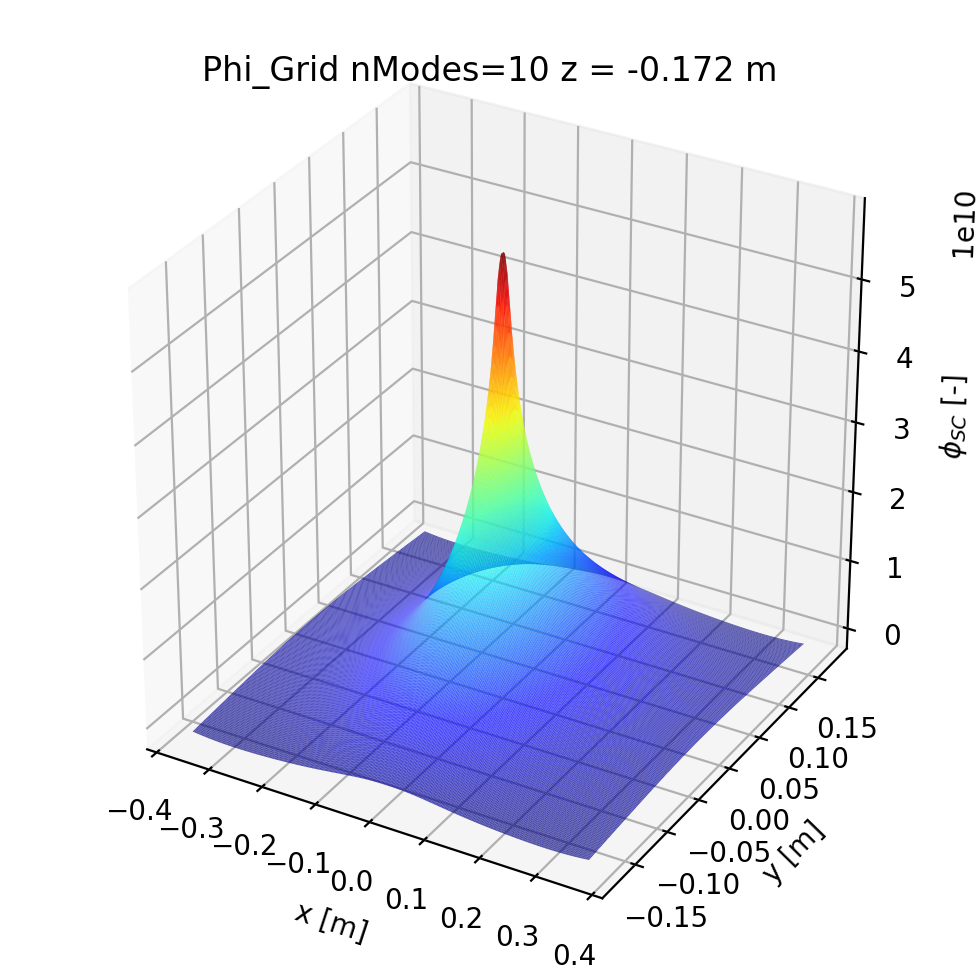

1

In [460]:
test.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=10', save=False, savename='Phi_Grid_xy_nmodes10.png')

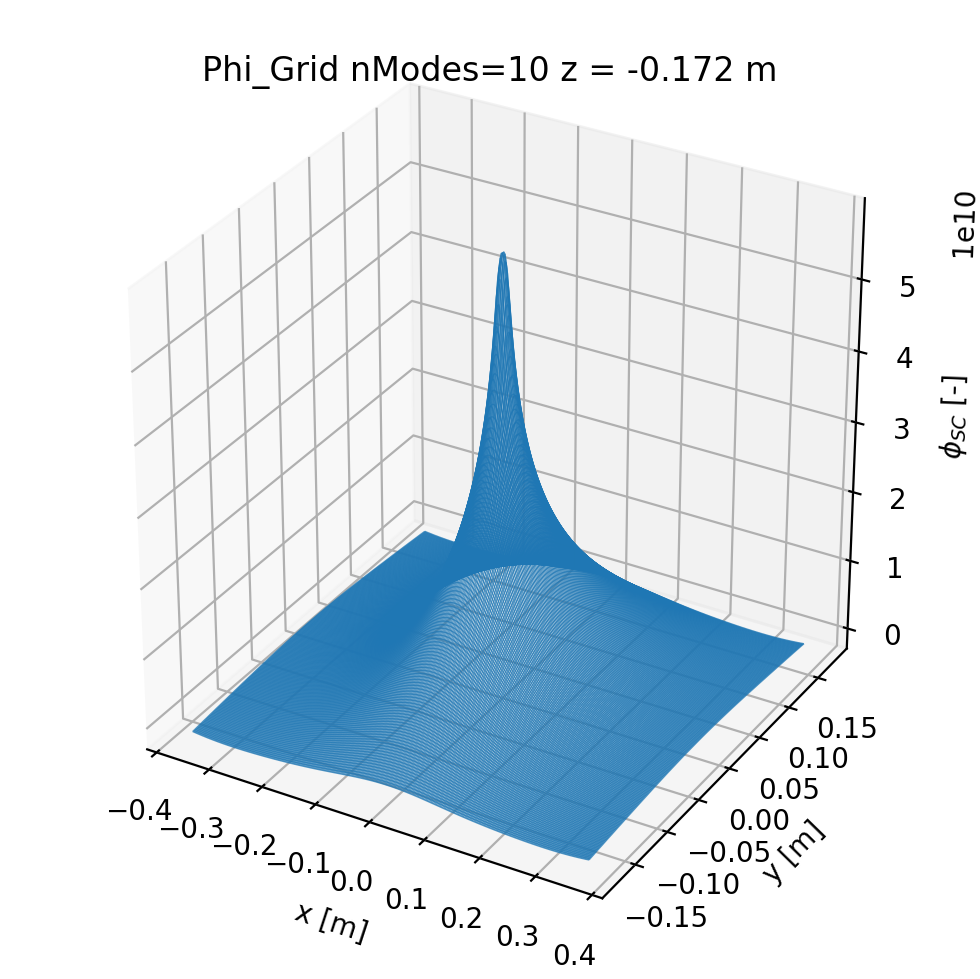

1

In [428]:
test.plot_xy_phi_wireframe(31, title='Phi_Grid', label='nModes=10', save=False, savename='Phi_Grid_xy_nmodes10.png')

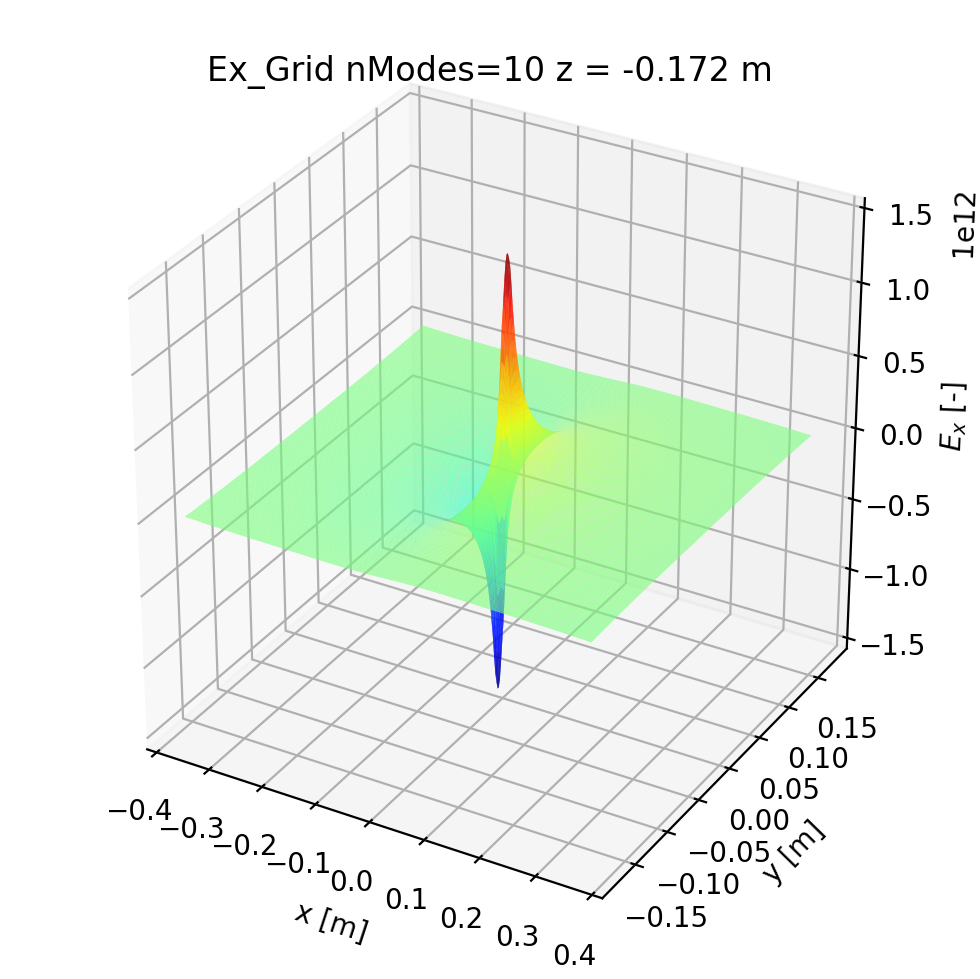

1

In [429]:
test.plot_xy_Ex_surface(31, title='Ex_Grid', label='nModes=10', save=False, savename='Ex_Grid_xy_nmodes10.png')

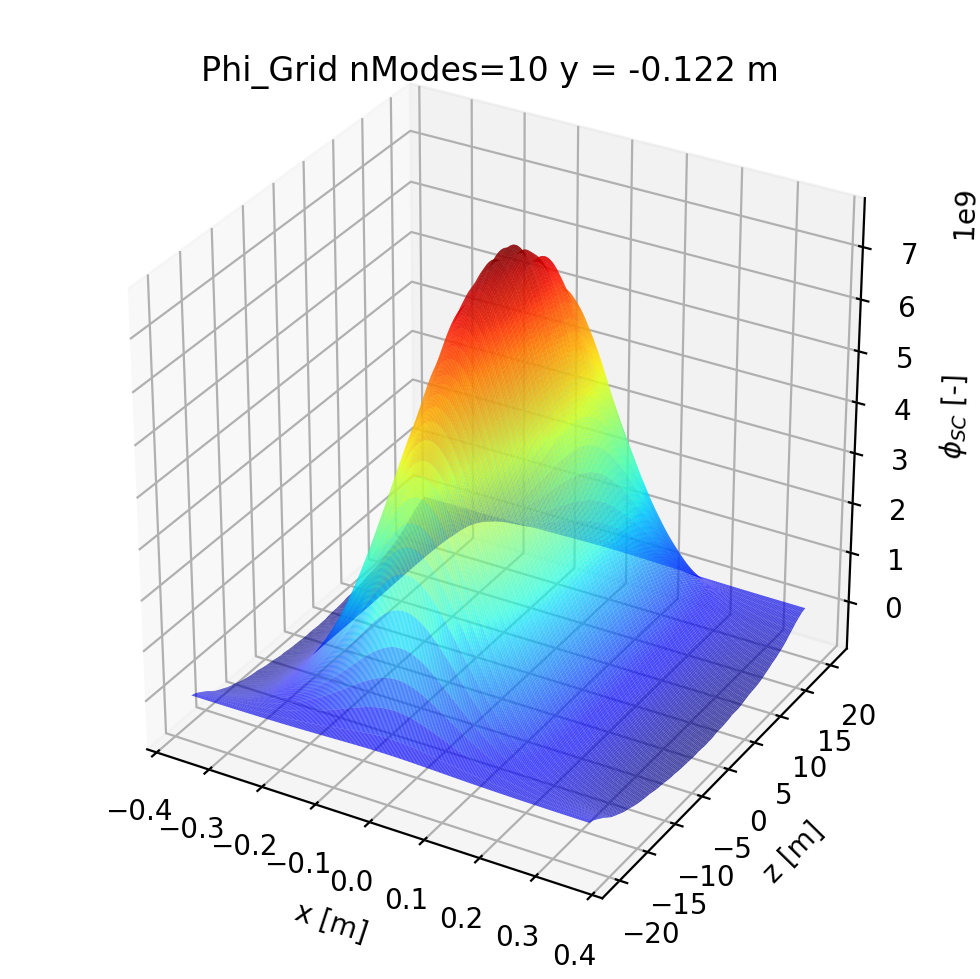

1

In [436]:
test.plot_xz_phi_surface(31, title='Phi_Grid', label='nModes=10', save=False, savename='Phi_Grid__xz_nmodes10.png')

# nModes = 1

In [437]:
test2 = PhiGrid('1_1_1/space_charge_output_nMode1/Phi_grid_0.mat', 'nModes=1')

PhiGrid::initialise_data: Added output data from  1_1_1/space_charge_output_nMode1/Phi_grid_0.mat 	 dictionary label:  nModes=1
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64


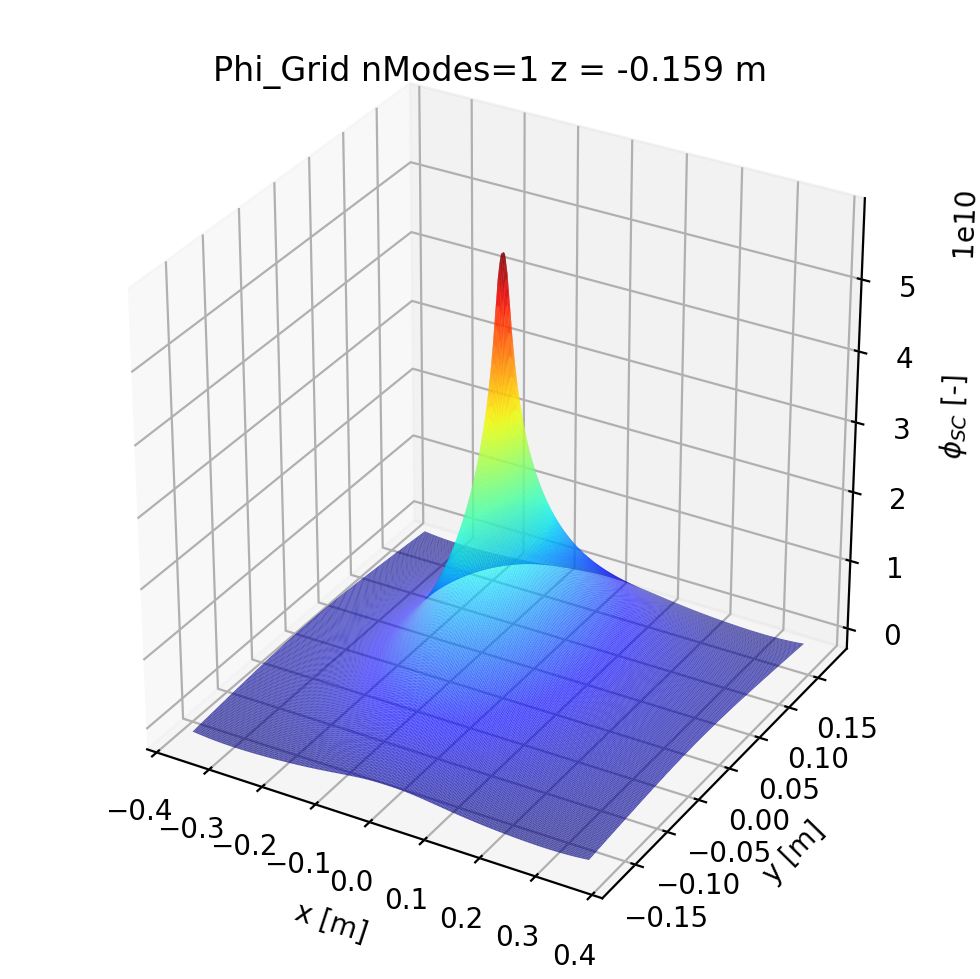

1

In [438]:
test2.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=1', save=False, savename='Phi_Grid_nmodes1.png')

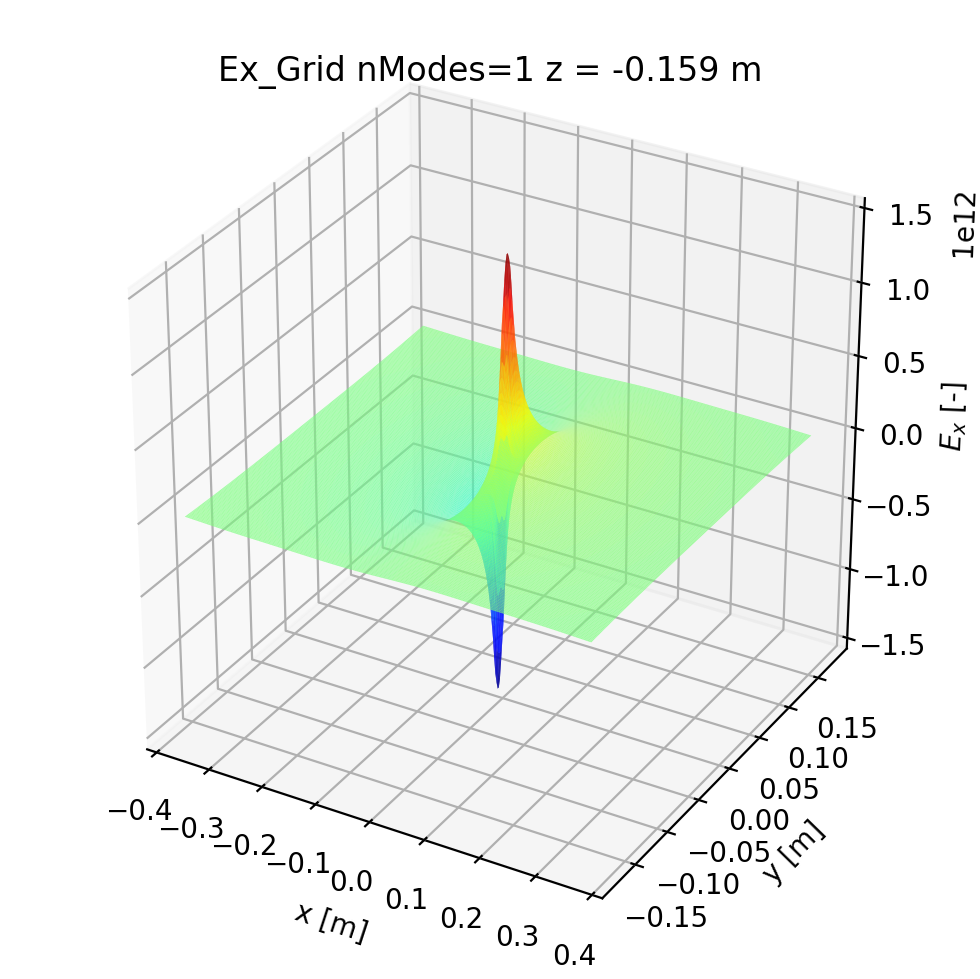

1

In [439]:
test2.plot_xy_Ex_surface(31, title='Ex_Grid', label='nModes=1', save=False, savename='Ex_Grid_nmodes1.png')

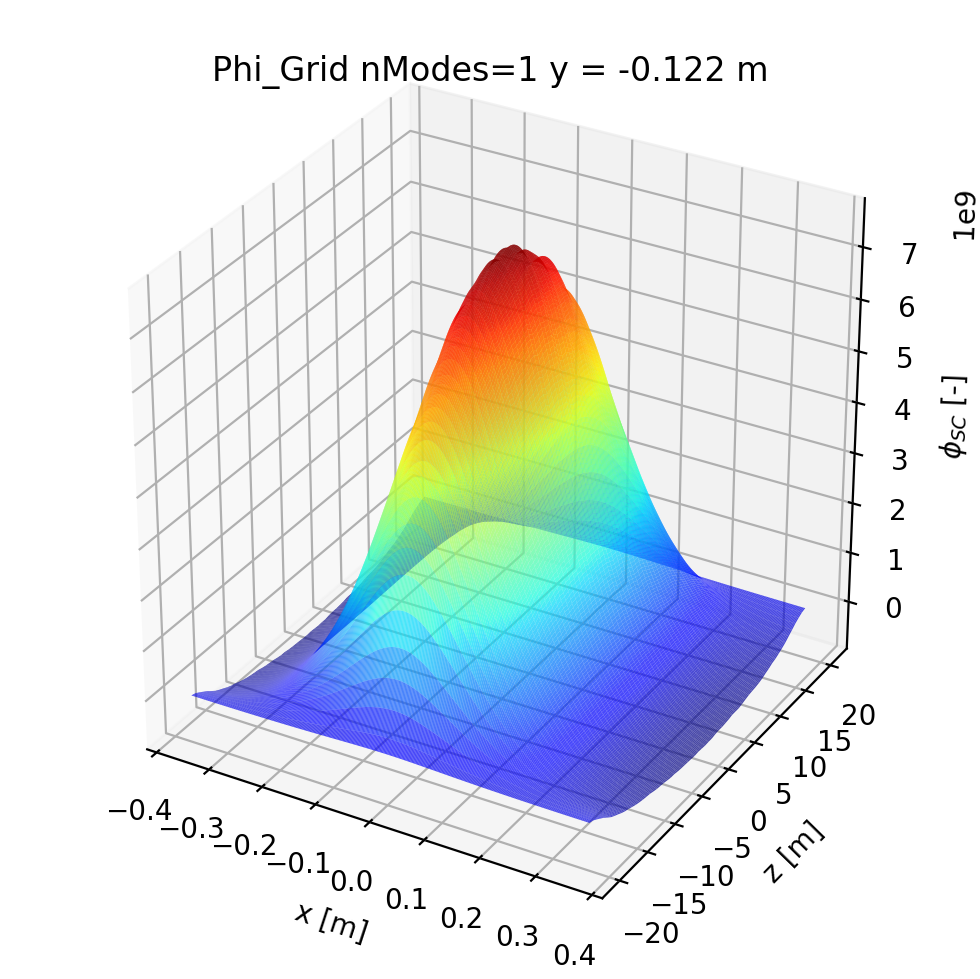

1

In [441]:
test2.plot_xz_phi_surface(31, title='Phi_Grid', label='nModes=1', save=False, savename='Phi_Grid__xz_nmodes1.png')

# nModes = 50

In [452]:
test3 = PhiGrid('1_1_1/space_charge_output_nMode50/Phi_grid_0.mat', 'nModes=50')

PhiGrid::initialise_data: Added output data from  1_1_1/space_charge_output_nMode50/Phi_grid_0.mat 	 dictionary label:  nModes=50
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64


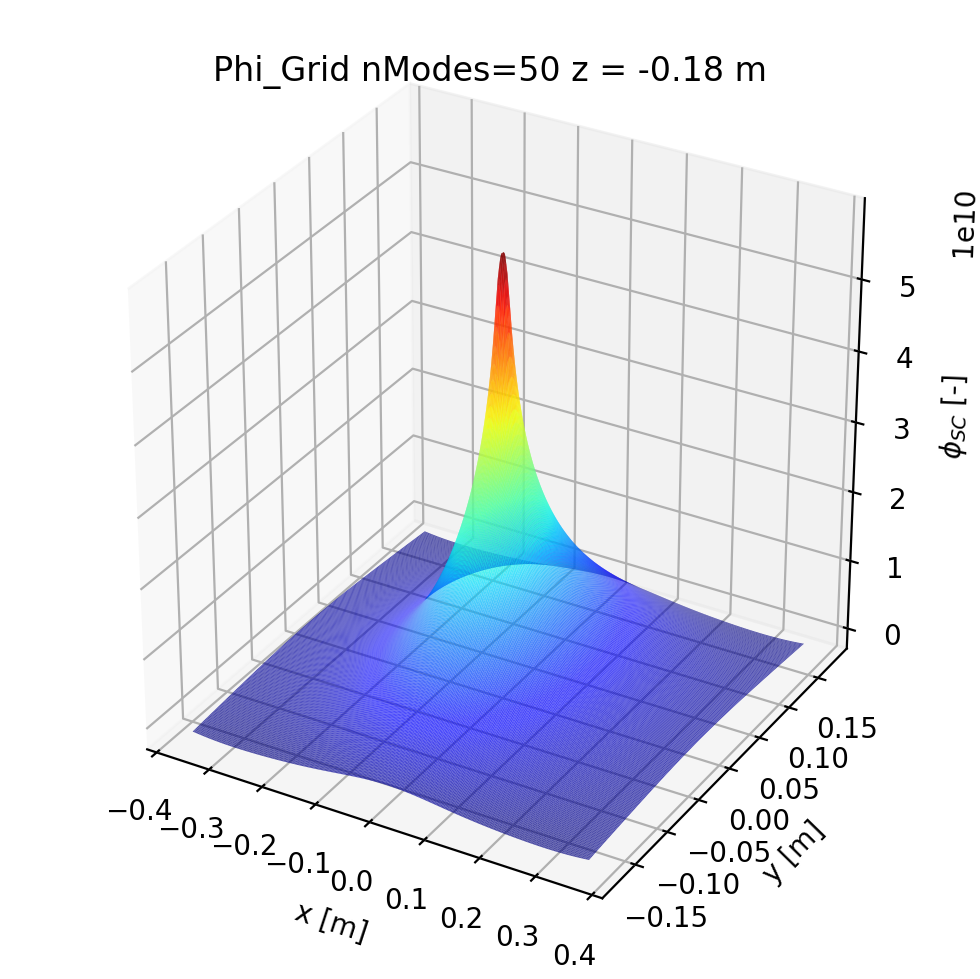

1

In [453]:
test3.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=50', save=False, savename='Phi_Grid_nmodes50.png')

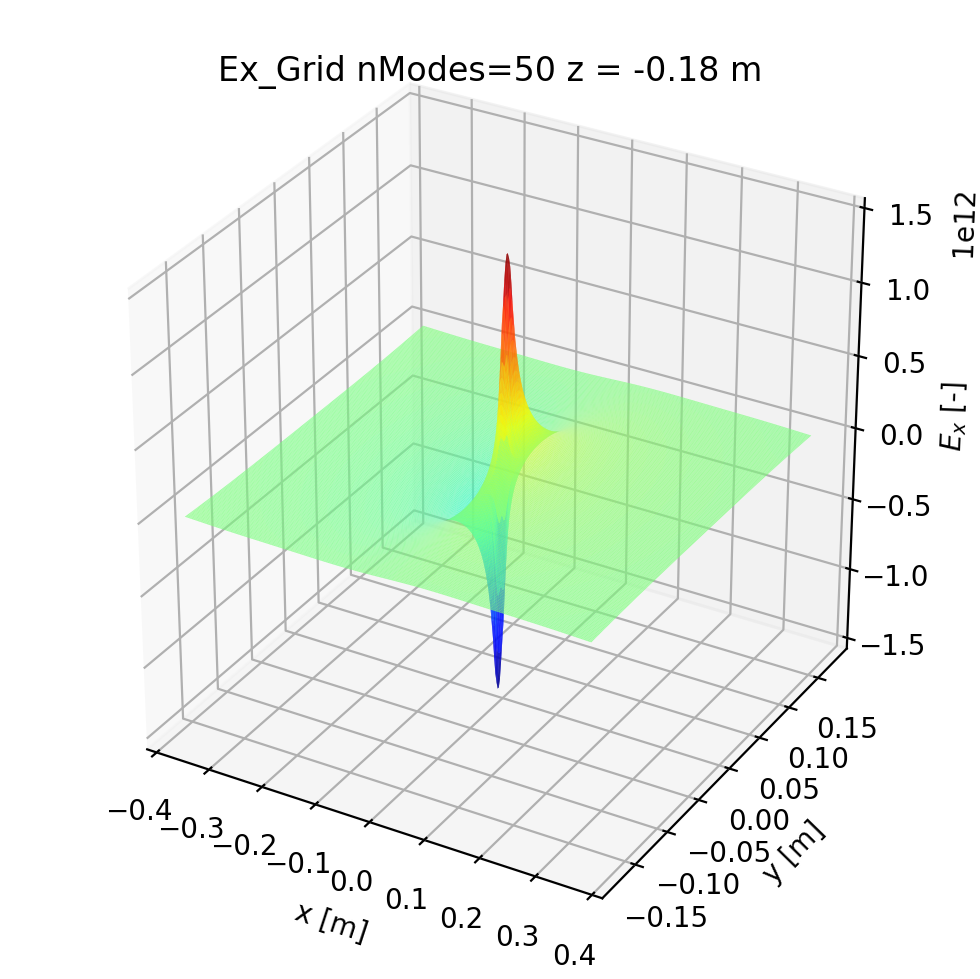

1

In [454]:
test3.plot_xy_Ex_surface(31, title='Ex_Grid', label='nModes=50', save=False, savename='Ex_Grid_nmodes50.png')

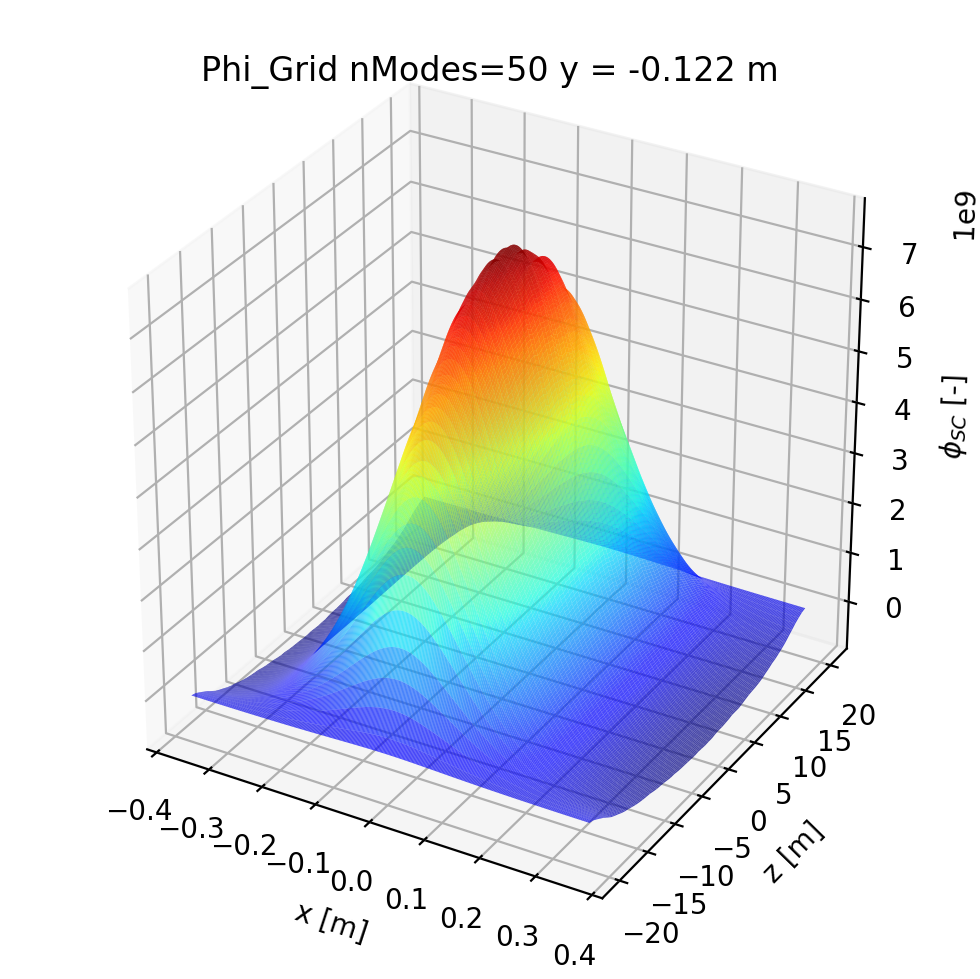

1

In [455]:
test3.plot_xz_phi_surface(31, title='Phi_Grid', label='nModes=50', save=False, savename='Phi_Grid__xz_nmodes50.png')

# nModes = 50 499 points (instead of 128)

In [463]:
test4 = PhiGrid('1_1_1/space_charge_output_nMode50_499/Phi_grid_0.mat', 'nModes=50')


PhiGrid::initialise_data: Added output data from  1_1_1/space_charge_output_nMode50_499/Phi_grid_0.mat 	 dictionary label:  nModes=50
PhiGrid::initialise_data: X grid length =  312
PhiGrid::initialise_data: Y grid length =  206
PhiGrid::initialise_data: Z grid length =  64


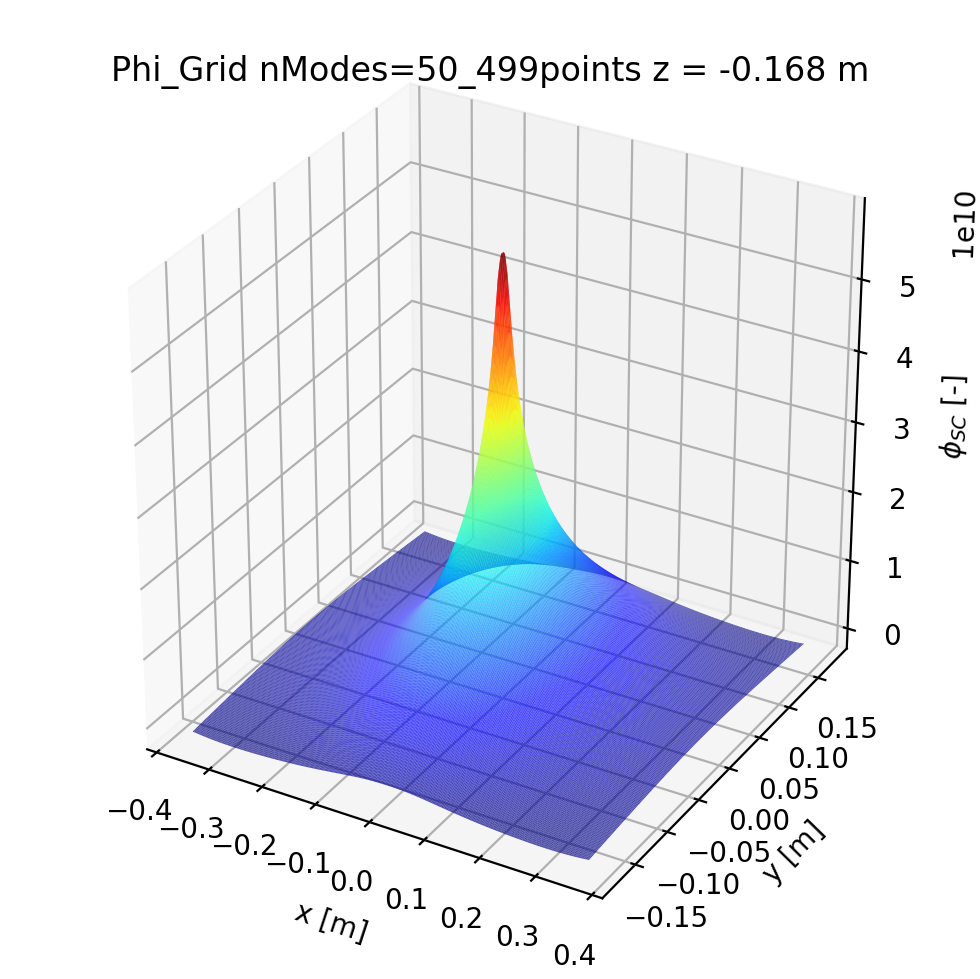

1

In [464]:
test4.plot_xy_phi_surface(31, title='Phi_Grid', label='nModes=50_499points', save=False, savename='Phi_Grid_nmodes50_499points.png')

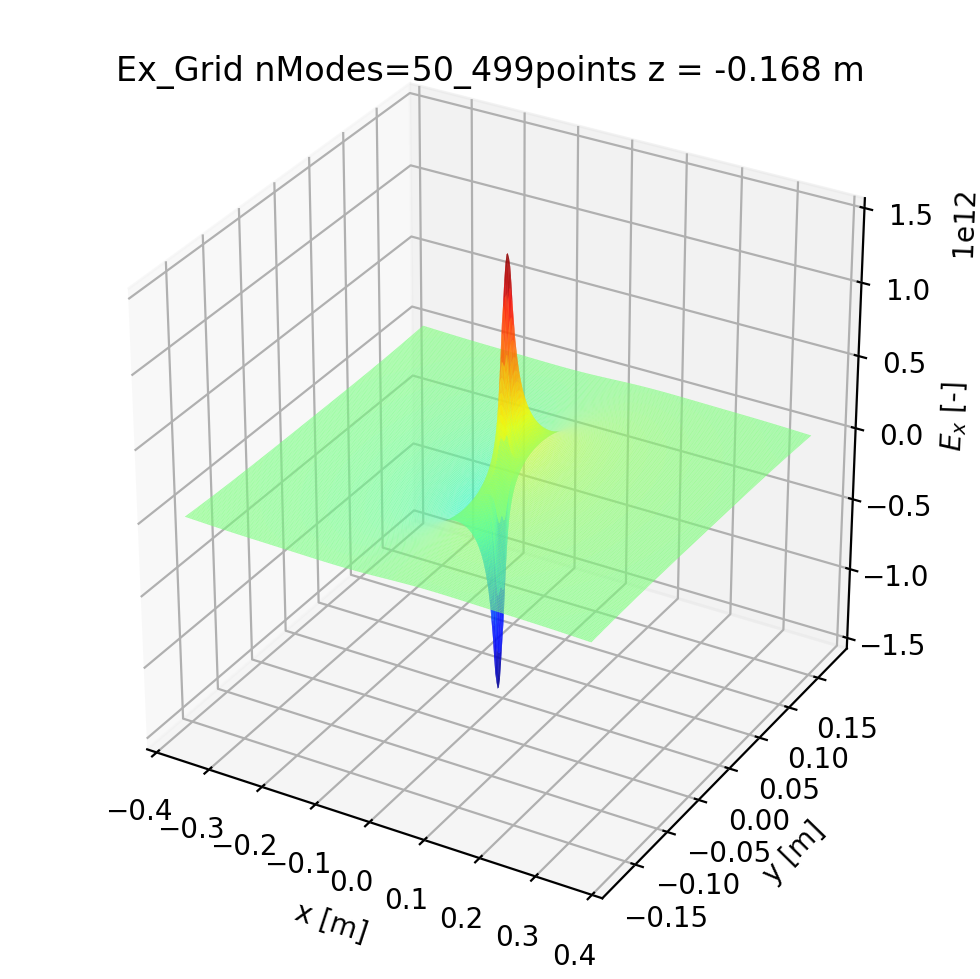

1

In [465]:
test4.plot_xy_Ex_surface(31, title='Ex_Grid', label='nModes=50_499points', save=False, savename='Ex_Grid_nmodes50_499points.png')

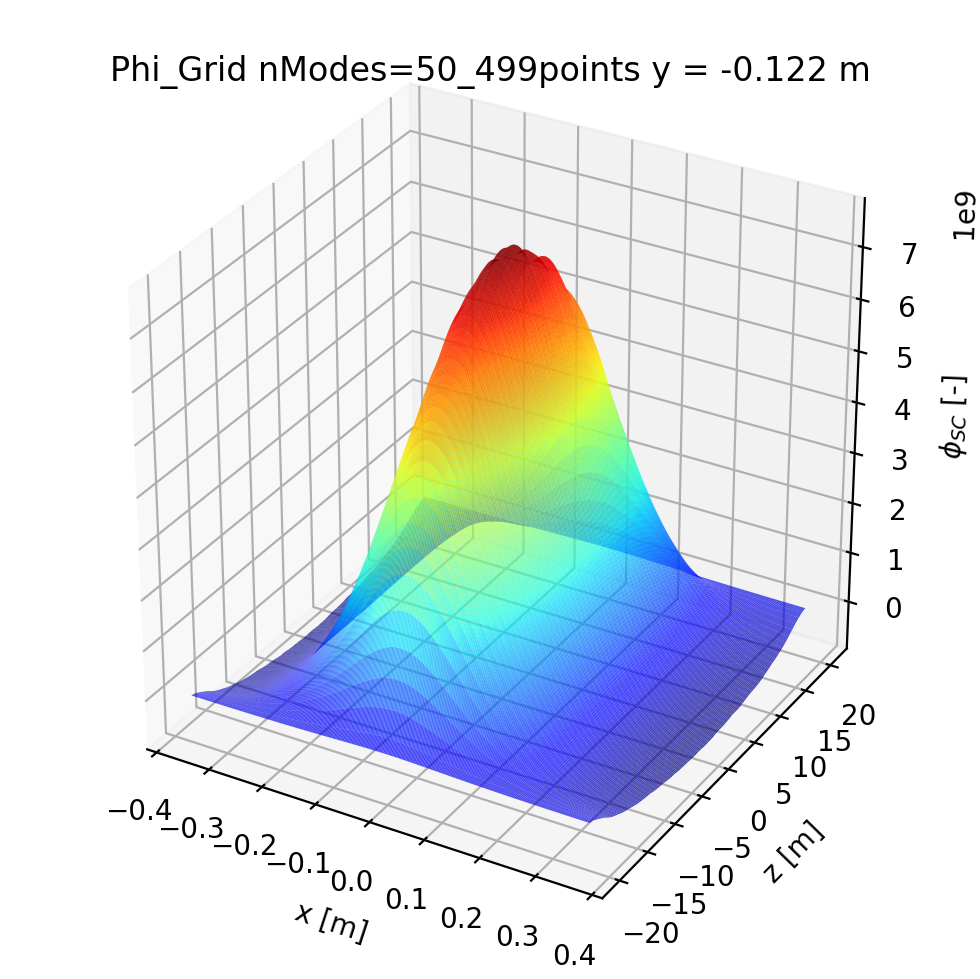

1

In [466]:
test4.plot_xz_phi_surface(31, title='Phi_Grid', label='nModes=50_499points', save=False, savename='Phi_Grid__xz_nmodes50_499points.png')

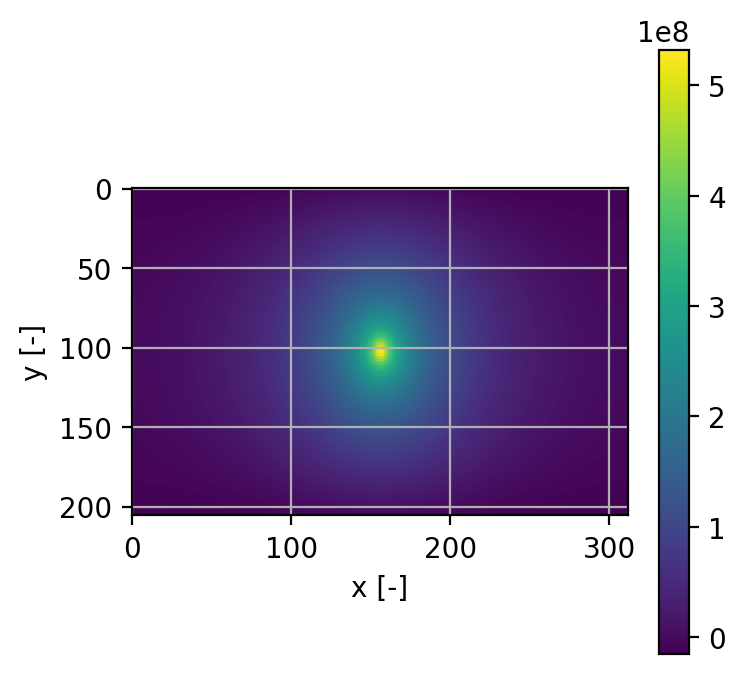

In [269]:
fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

pos = ax1.imshow(test_phi_grid)
fig1.colorbar(pos, ax=ax1)
ax1.set_ylabel('y [-]');
ax1.set_xlabel('x [-]');
ax1.grid()

# Plot x potential at centre y co-ordinate, for each z slice

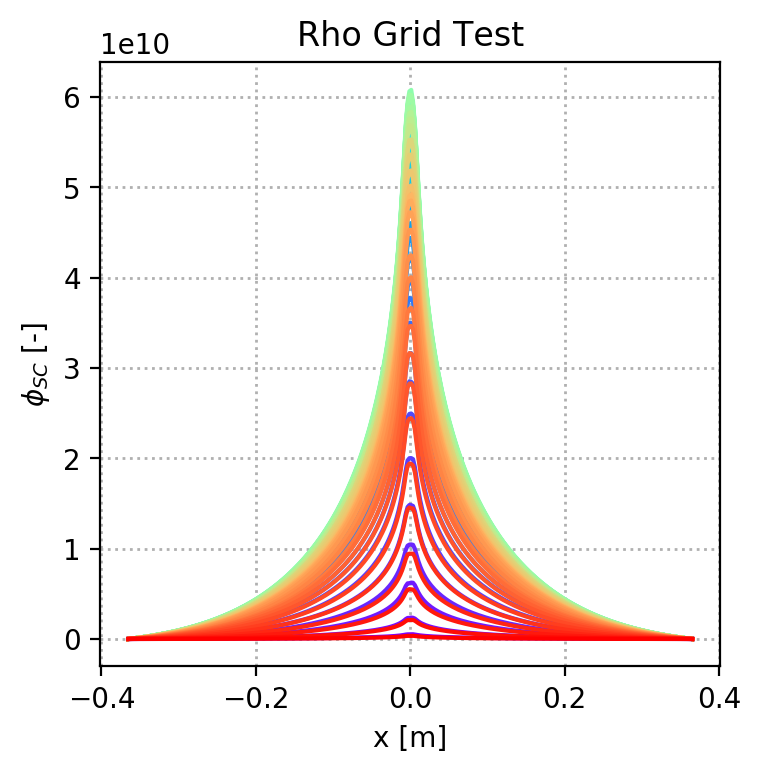

In [271]:
fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label
ax1.set_title(tit);

ax1.set_ylabel(r'$\phi_{SC}$ [-]');
ax1.set_xlabel('x [m]');

z_len = int(test.get_z_grid_length())

colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
c_it = int(0)

for iz in xrange(test.get_z_grid_length()):
    ax1.plot(test.get_x_coordinates(), test.get_phi_xy_grid(iz)[103], color=colors[c_it])
    c_it = c_it + 1;
    
#ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-1,turn_tot)

#savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
#plt.savefig(savename, dpi = 800);

## We can do this with slices of data

In [276]:
test_phi_slice = test.get_phi_x_slice(int(test.get_y_grid_length()/2), 0)

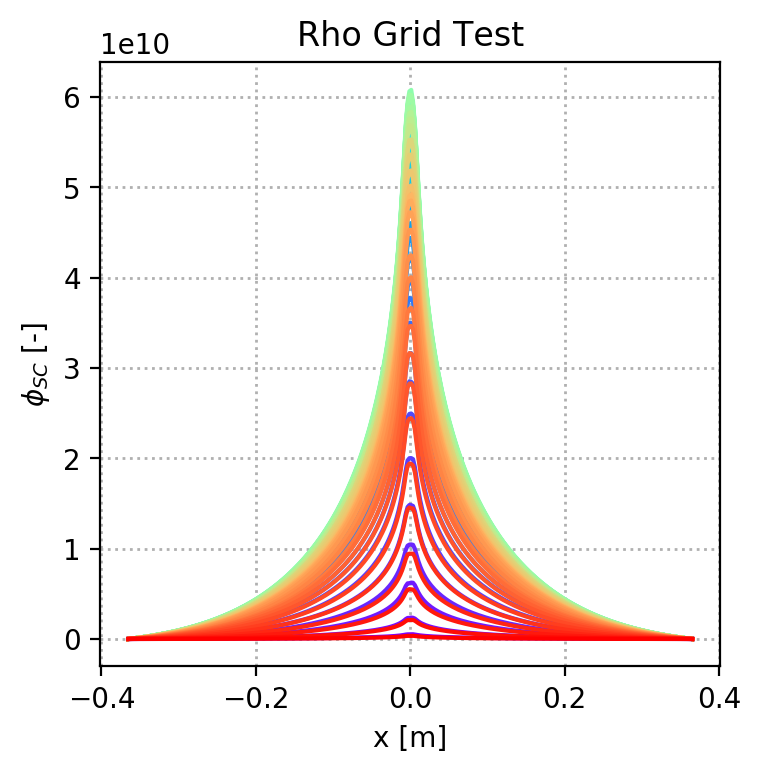

In [281]:
fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label
ax1.set_title(tit);

ax1.set_ylabel(r'$\phi_{SC}$ [-]');
ax1.set_xlabel('x [m]');

z_len = int(test.get_z_grid_length())

colors = matplotlib.cm.rainbow(np.linspace(0, 1, z_len))
c_it = int(0)

for iz in xrange(test.get_z_grid_length()):
    ax1.plot(test.get_x_coordinates(), test.get_phi_x_slice(int(test.get_y_grid_length()/2), iz), color=colors[c_it])
    c_it = c_it + 1;
    
#ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-1,turn_tot)

#savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
#plt.savefig(savename, dpi = 800);

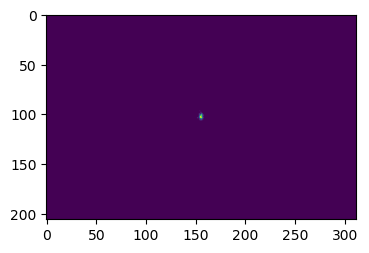

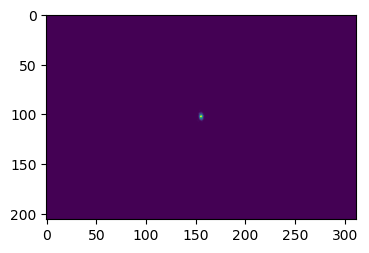

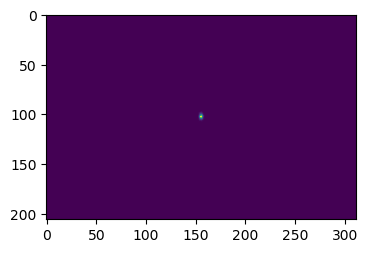

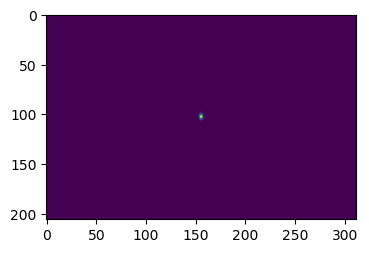

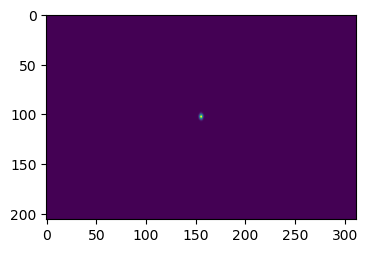

...

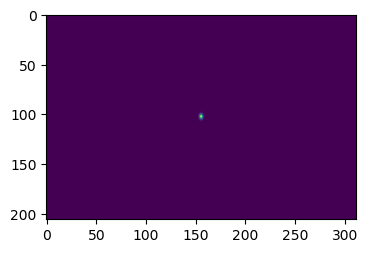

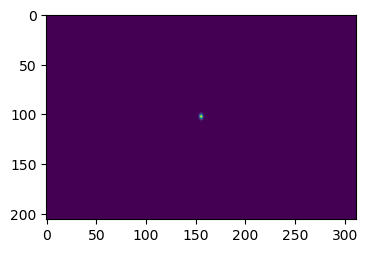

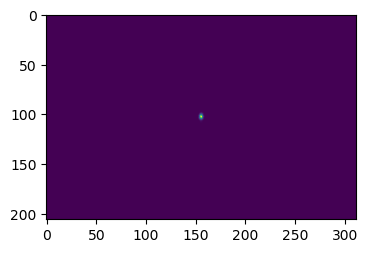

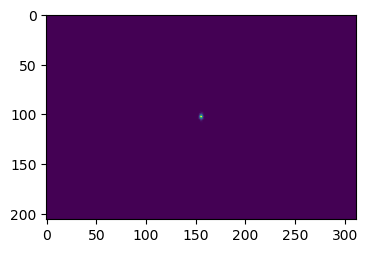

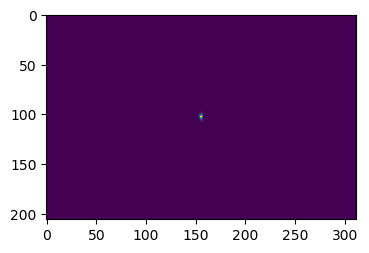

In [62]:
for iz in xrange(z_grid_len):
    for iy in xrange(y_grid_len):
        for ix in xrange(x_grid_len):
            #print ix, iy
            xy_[iy,ix] = dd_rho['Rho']['rho_grid'][ix][iy][iz]  
    plt.imshow(xy_)
    plt.show()

In [63]:
### Check size of charge density grid
rho_x_min = dd_rho['Rho']['x_grid'][0][0][0]
rho_x_max = dd_rho['Rho']['x_grid'][x_grid_len-1][0][0]
print 'x_min = ', rho_x_min, ' m'
print 'x_max = ', rho_x_max, ' m'

rho_y_min = dd_rho['Rho']['y_grid'][0][0][0]
rho_y_max = dd_rho['Rho']['y_grid'][0][y_grid_len-1][0]
print 'y_min = ', rho_y_min, ' m'
print 'y_max = ', rho_y_max, ' m'


rho_z_min = dd_rho['Rho']['z_grid'][0][0][0]
rho_z_max = dd_rho['Rho']['z_grid'][0][0][z_grid_len-1]
print 'z_min = ', rho_z_min, ' m'
print 'z_max = ', rho_z_max, ' m'

x_min =  -0.365  m
x_max =  0.365  m
y_min =  -0.175  m
y_max =  0.175  m
z_min =  -20.09981017398953  m
z_max =  20.39783837832807  m


## Plot Space Charge Potential (Phi) Grid for each z slice

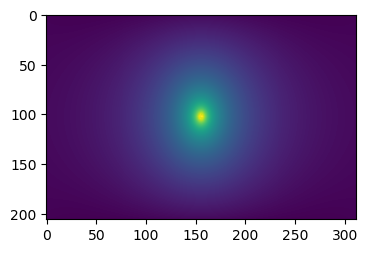

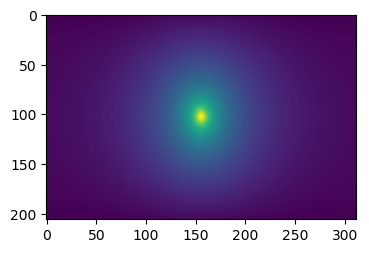

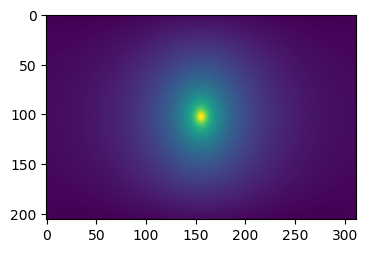

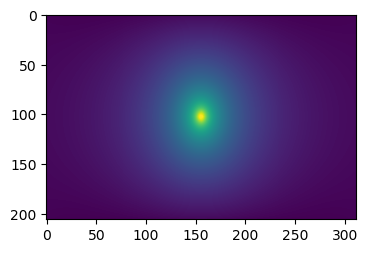

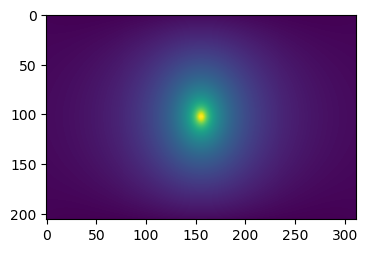

...

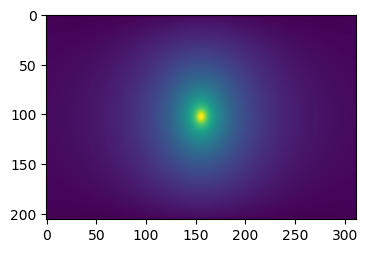

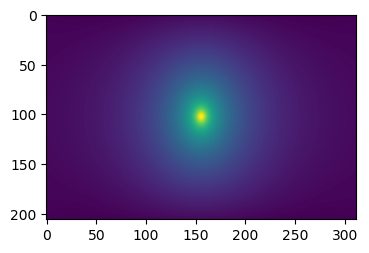

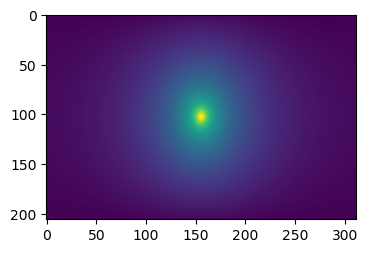

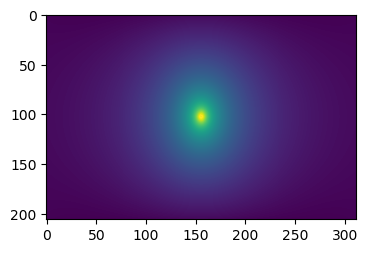

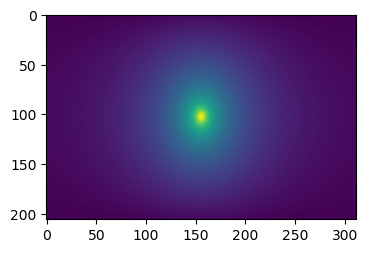

In [64]:
for iz in xrange(z_grid_len):
    for iy in xrange(y_grid_len):
        for ix in xrange(x_grid_len):
            #print ix, iy
            xy_[iy,ix] = dd_phi['Phi']['phi_grid'][ix][iy][iz]  
    plt.imshow(xy_)
    plt.show()

In [65]:
### Check size of charge density grid
phi_x_min = dd_phi['Phi']['x_grid'][0][0][0]
phi_x_max = dd_phi['Phi']['x_grid'][x_grid_len-1][0][0]
print 'x_min = ', phi_x_min, ' m'
print 'x_max = ', phi_x_max, ' m'

phi_y_min = dd_phi['Phi']['y_grid'][0][0][0]
phi_y_max = dd_phi['Phi']['y_grid'][0][y_grid_len-1][0]
print 'y_min = ', phi_y_min, ' m'
print 'y_max = ', phi_y_max, ' m'


phi_z_min = dd_phi['Phi']['z_grid'][0][0][0]
phi_z_max = dd_phi['Phi']['z_grid'][0][0][z_grid_len-1]
print 'z_min = ', phi_z_min, ' m'
print 'z_max = ', phi_z_max, ' m'

x_min =  -0.365  m
x_max =  0.365  m
y_min =  -0.175  m
y_max =  0.175  m
z_min =  -20.09981017398953  m
z_max =  20.39783837832807  m


## Plot the E_x field for each z slice

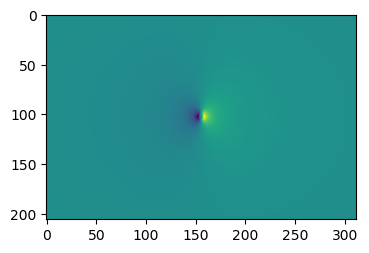

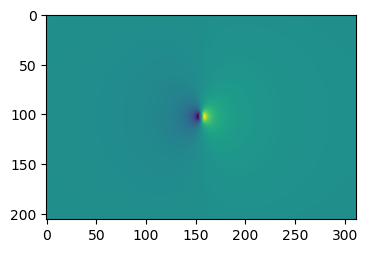

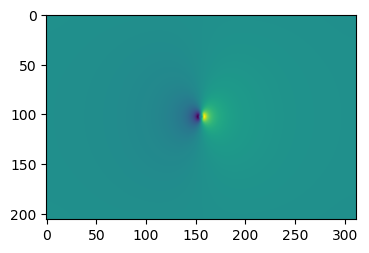

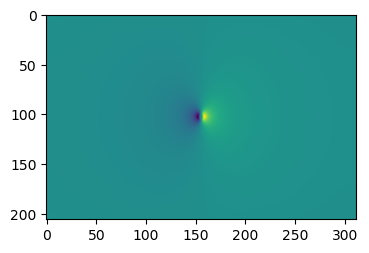

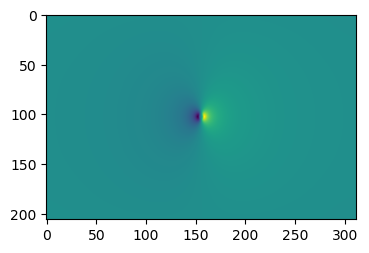

...

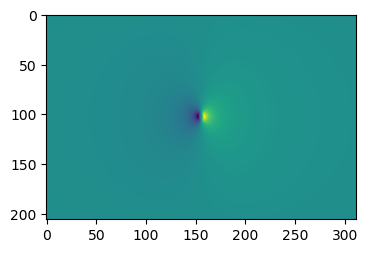

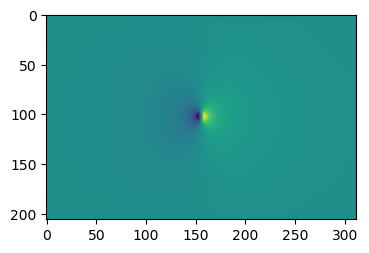

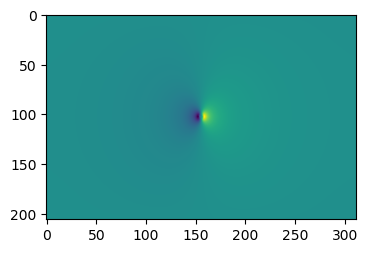

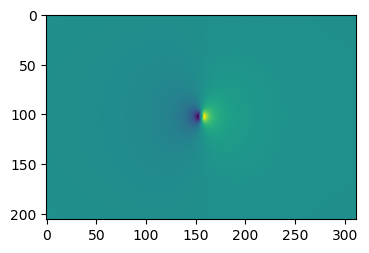

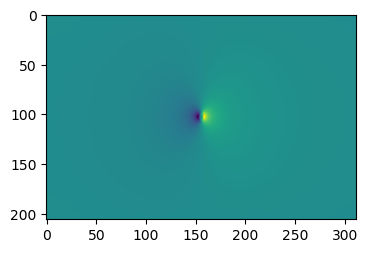

In [66]:
for iz in xrange(z_grid_len):
    for iy in xrange(y_grid_len):
        for ix in xrange(x_grid_len):
            #print ix, iy
            xy_[iy,ix] = dd_phi['Phi']['Ex_grid'][ix][iy][iz]  
    plt.imshow(xy_)
    plt.show()

## Plot the x potential for each z slice

ValueError: x and y must have same first dimension, but have shapes (311,) and (312,)

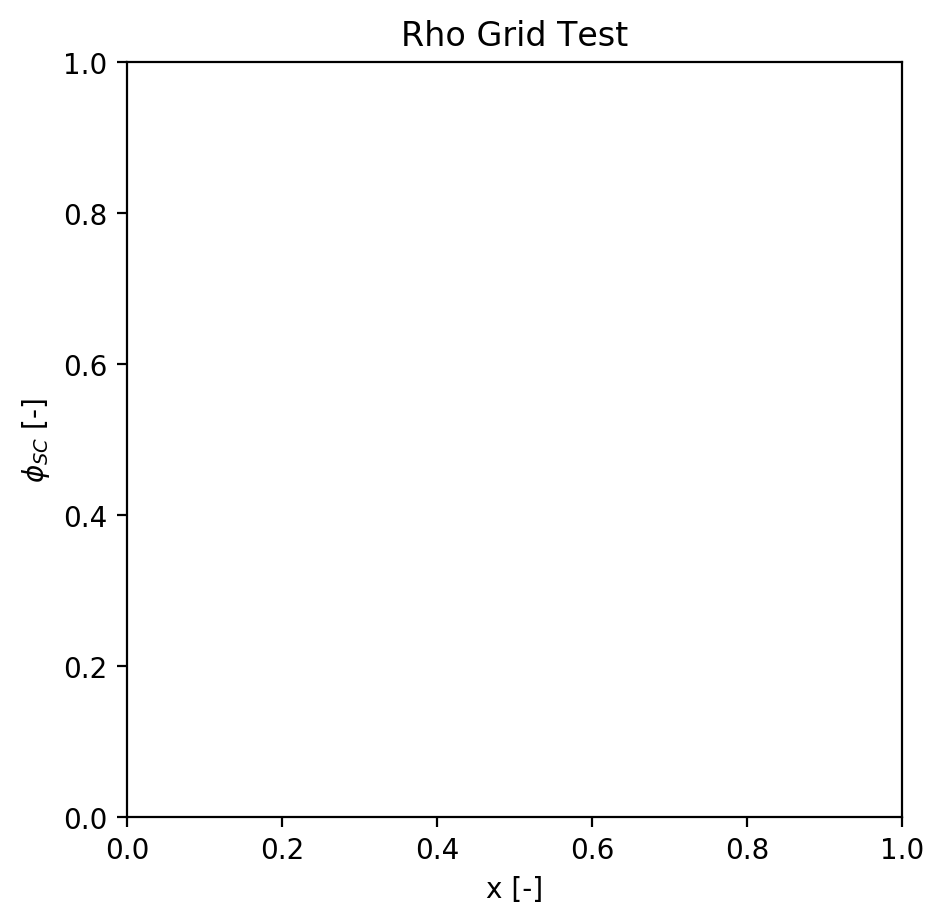

In [54]:
fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label
ax1.set_title(tit);

ax1.set_ylabel(r'$\phi_{SC}$ [-]');
ax1.set_xlabel('x [-]');

for iz in xrange(z_grid_len):
    y_dat = []
    for ix in xrange(x_grid_len): 
        y_dat.append(dd_phi['Phi']['phi_grid'][ix][102][iz])    
    ax1.plot(x_, y_dat)

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(-1,turn_tot)

#savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
#plt.savefig(savename, dpi = 800);